In [12]:
!nvidia-smi

Wed Dec 17 08:20:52 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 2080 Ti     Off |   00000000:B2:00.0 Off |                  N/A |
| 22%   24C    P8             17W /  250W |    4126MiB /  11264MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [13]:
import os
# NOTE!
# this is for a multi-gpu setup. we basically set which GPU is visible for the program.
# if you only have one GPU (most likely the case ;) ), make sure this is set to "0"!
# or remove this line completely!
# otherwise you may accidentally make your GPU "invisible" to the program!
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

# Glow

This notebook contains code for a basic functional Glow model.
Note that I am very unsure about many of the finer aspects.
As such, we offer plenty of options to try, with additional comments as to their usage.
Take everything with a grain of salt.
Hopefully there is something interesting for you in there!

In [14]:
import numpy as np
import torch
from matplotlib import pyplot as plt
from torch import nn

from lgm.common import count_parameters, plot_learning_curves, EMA, sum_except
from lgm.data import get_datasets_and_loaders, dataset_mean_std, Normalize, UniformDequantize, ToLogit, FromLogit
from lgm.evaluation import get_classifier, fid, inception_score_with_features, precision_recall
from lgm.flow import GlowFlow, FlowTrainer
from lgm.layers import CNNBody, ConvBlockPrenorm
from lgm.visualization import plot_image_grid

torch.set_float32_matmul_precision('high')
torch.backends.cudnn.benchmark = True

## Data

FashionMNIST can be a reasonable benchmark to try. It should be possible without too big of a model, which is important considering how parameter-hungry flows tend to be in general.

There are some important notes on data processing here:
- As with NICE, we have to dequantize the data.
- RealNVP states that they don't actually model the pixel values, but transform them to logit space.
I honestly have doubts regarding the efficacy of this transformation, but you can try it if you want.
If you don't like it, just remove the `ToLogit` transforms from `get_datasets_and_loaders` (both calls) and `FromLogit` from the `descale_data` function.
- We can once again normalize data to mean 0 and standard deviation 1.

The order of transforms is very important!
1. If you want to use a larger dataset and resize (e.g. flickr at 64x64), the first transform should be `Resize`.
2. Next comes dequantization, as this expects data scaled in [0, 1].
3. Then the optional `ToLogit` transform if you like that -- this also needs [0, 1]-scaled data.
4. Normalization, if desired, comes last, i.e. if we transform to logits, we will normalize _those_ instead of the original pixel values.

So the order should be `(Resize) -> UniformDequantize -> (ToLogit) -> (Normalize)` where the transforms in (brackets) are optional.
Make sure to inspect the example images plotted below. if they look messed up somehow, something is wrong with your transforms.

Also, in case you want to try non-image data like audio, you should get rid of the dequantize and logit transforms -- they are intended for image data.
Since audio is usually stored with at least 16 bits, dequantization should be less of a concern here.

In [15]:
data = "fashion"
batch_size = 256
logit_alpha = 0.05

train_data, test_data, train_dataloader, test_dataloader = get_datasets_and_loaders(data, batch_size, num_workers=16, verbose=False,
                                                                                    additional_transforms=[ToLogit(alpha=logit_alpha)])

data_mean, data_std = dataset_mean_std(train_dataloader, per_dim=False)
#data_mean, data_std = torch.tensor(0.), torch.tensor(1.)
data_mean, data_std

(tensor(-1.7050), tensor(1.7895))

Shape/dtype of batch X [N, C, H, W]: torch.Size([256, 1, 32, 32]), torch.float32
Shape/dtype of batch y: torch.Size([256]), torch.int64


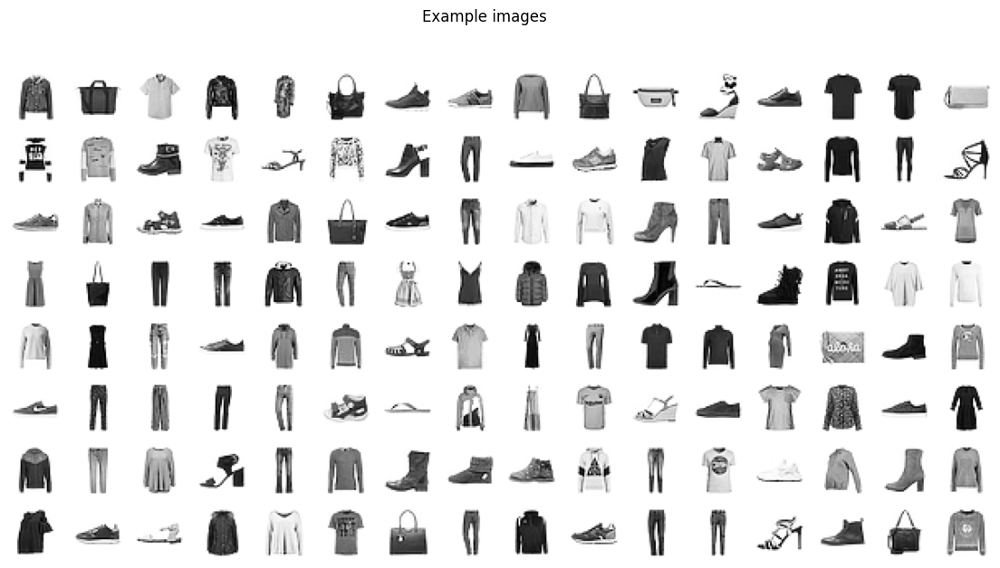

In [16]:
from_logits = FromLogit(alpha=logit_alpha)

def descale_data(imgs):
    denormalized = data_std.to(imgs.device) * imgs + data_mean.to(imgs.device)
    return from_logits(denormalized)


scale_data = Normalize(data_mean, data_std)

train_data, test_data, train_dataloader, test_dataloader = get_datasets_and_loaders(data, batch_size, num_workers=16,
                                                                                    additional_transforms=[UniformDequantize(),
                                                                                                           ToLogit(alpha=logit_alpha),
                                                                                                           scale_data],
                                                                                    plot_descale=descale_data)

## Model

Quite a lot to unpack here.
- We propose here using a "bottleneck residual" design for the coupling layers. This uses 3 layers per residual connection, with 1x1 convolutions to create a smaller 3x3 convolution in the middle.
This is more parameter-efficient for very deep networks.
  - Note that we somewhat abuse the `CNNBody` function. We only create a _single_ level, because the idea of "levels" working at different resolutions is covered by the Glow model itself.
    Each _coupling layer_ should only work at a single level.
  - We found it usually better to use more coupling layers with fewer convolutions, rather than fewer coupling layers that are individually deeper.
    For example, you could use `blocks_per_level=1`, but double `n_layers_per_level`. However, this also tends to be a good bit slower.
- The paper proposes to initialize the weights in the final convolution of each coupling layer to 0.
  This results in an identity function _for default settings_: The shift will be 0, and the scale will be 0, which will be mapped to 1 by the `exp` scaling function.
  - Unfortunately, the official code actually uses _sigmoid_ as a scaling function. We found this to improve training stability.
    However, `sigmoid(0) = 0.5`, resulting in this initialization actually scaling down the inputs at each layer.
    We can alleviate this by using the `biased_sigmoid` defined below.
    This adds a positive value to move outputs closer to 1.
  - In practice, chances are this "problem" is fixed by the _activation maximization_ operations placed after each coupling layer, anyway.
- We use 3 levels for 32x32 images.
  Since Glow immediately "squeezes" the data to 16x16, this means the levels work at 16, 8, and 4 pixels.
  - When using larger resolutions, you should add one more level per multiplier of 2.
    So for example, for 64x64 data, use 4 levels.

If you rather want to use the exact coupling layer proposed in the Glow paper:
- Use `layer_factory_glow` instead.
- Set `hidden_dim_base = 512`.
- **Important:** Set `channel_growth_factor = 1` in `GlowFlow` or your model will end up absurdly large.
- Note that your model will have way more parameters and run much slower.
  Of course you can play around with `hidden_dim_base` or the number of coupling layers per level.
- We also found this to be unstable and lead to `nan` losses. :(

In [17]:
hidden_dim_base = 128
block_fn = ConvBlockPrenorm
kernel_size = 3
activation = nn.Mish
block_kwargs = {"n_layers": 3, "activation": activation, "kernel_size": kernel_size,
                "use_se": True, "se_reduction_factor": 8, "se_bias": 1.,
                "use_residual": True, "bottleneck_factor": 4,
                "norm": nn.GroupNorm, "norm_groups": -16}


def layer_factory_residual(in_dim, hidden_dim):
    net = nn.Sequential(nn.Conv2d(in_channels=in_dim, out_channels=hidden_dim, kernel_size=1),
                        CNNBody(blocks_per_level=2, level_filters=[hidden_dim], level_strides=[1],
                                input_channels=hidden_dim, direction="down", block_fn=block_fn, **block_kwargs),
                        nn.Conv2d(in_channels=hidden_dim, out_channels=2*in_dim, kernel_size=1))
    torch.nn.init.zeros_(net[-1].weight)
    torch.nn.init.zeros_(net[-1].bias)
    return net


def layer_factory_glow(in_dim, hidden_dim):
    net = nn.Sequential(nn.Conv2d(in_channels=in_dim, out_channels=hidden_dim, kernel_size=3, padding="same"),
                        activation(),
                        nn.Conv2d(in_channels=hidden_dim, out_channels=hidden_dim, kernel_size=1),
                        activation(),
                        nn.Conv2d(in_channels=hidden_dim, out_channels=2*in_dim, kernel_size=3, padding="same"))
    torch.nn.init.zeros_(net[-1].weight)
    torch.nn.init.zeros_(net[-1].bias)
    return net


def biased_sigmoid(x):
    return torch.nn.functional.sigmoid(x + 2)

In [18]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

with torch.no_grad():
    dummy = next(iter(train_dataloader))[0]
input_shape = dummy.shape[1:]
noise_shape = int(np.prod(input_shape))

    
base_distribution = torch.distributions.Normal(loc=0., scale=1.)
n_levels = 3
scale_fn = biased_sigmoid

model = GlowFlow(input_shape, n_levels, n_layers_per_level=12,
                 hidden_dim_base=hidden_dim_base, transform_factory=layer_factory_residual,
                 base_distribution=base_distribution,
                 scale_fn=scale_fn).eval()
model = model.to(device)

with torch.no_grad():
    # initialize model (actnorm parameters)!!
    test_simple = model(dummy.to(device))[0]
    test_back = model.transform_backward(test_simple)
inversion_difference = (dummy - test_back.cpu()).numpy()


print('\nIs this near 0? If not, DO NOT CONTINUE! FIX YOUR MODEL :)')
print(inversion_difference.min(), inversion_difference.max())

model.compile()

Using cuda device

Is this near 0? If not, DO NOT CONTINUE! FIX YOUR MODEL :)
-8.583069e-06 5.7816505e-06


In [19]:
model

GlowFlow(
  (levels): ModuleList(
    (0): GlowLevel(
      (layers): ModuleList(
        (0-11): 12 x GlowLayer(
          (transform_function): Sequential(
            (0): Conv2d(2, 128, kernel_size=(1, 1), stride=(1, 1))
            (1): CNNBody(
              (levels): ModuleList(
                (0): CNNLevel(
                  (blocks): ModuleList(
                    (0-1): 2 x ConvBlockPrenorm(
                      (first_norm): GroupNorm(8, 128, eps=1e-05, affine=True)
                      (layers): Sequential(
                        (0): Mish()
                        (1): Conv2d(128, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
                        (2): GroupNorm(2, 32, eps=1e-05, affine=True)
                        (3): Mish()
                        (4): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same, bias=False)
                        (5): GroupNorm(2, 32, eps=1e-05, affine=True)
                        (6): Mish()
                        (7

In [20]:
num_params = count_parameters(model)
print(f"Model with {num_params:,d} trainable parameters")

Model with 11,157,552 trainable parameters


## Training

Training flows can be tough. Some experiences:
- Lots and lots of epochs required -- training is quite slow.
- Learning rate may need to be decreased below the usual defaults.
  The wider and deeper a model, the higher the risk of instability.
- Unstable behavior (sudden spikes in the loss) may only materialize after 100s of epochs, making finding a good setup very cumbersome.
- Weight decay can alleviate instability, but at the same time mess with the scaling components of the flow, so it's not entirely clear whether it's a good idea to use this or not, and if so, how much.

In general, we have seen anything from FIDs way above 100, down to around 30-40 or so, with little understanding as to which factors consistently lead to improvements, or which hurt.
However, the model in this file with no changes got us to around 20 FID on FashionMNIST. Not so bad actually!

In [21]:
n_epochs = 350

optimizer = torch.optim.AdamW(model.parameters(), lr=0.0002, weight_decay=0.05, amsgrad=False)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs)
ema = EMA(model, 0.999)

trainer = FlowTrainer(model=model, optimizer=optimizer, scheduler=scheduler, ema=ema,
                      training_loader=train_dataloader, validation_loader=test_dataloader,
                      n_epochs=n_epochs, device=device, plot_every_n_epochs=20, verbose=True,
                      plot_descale=descale_data,
                      use_bits_per_dim=True)

Running 350 epochs at 234 steps per epoch.


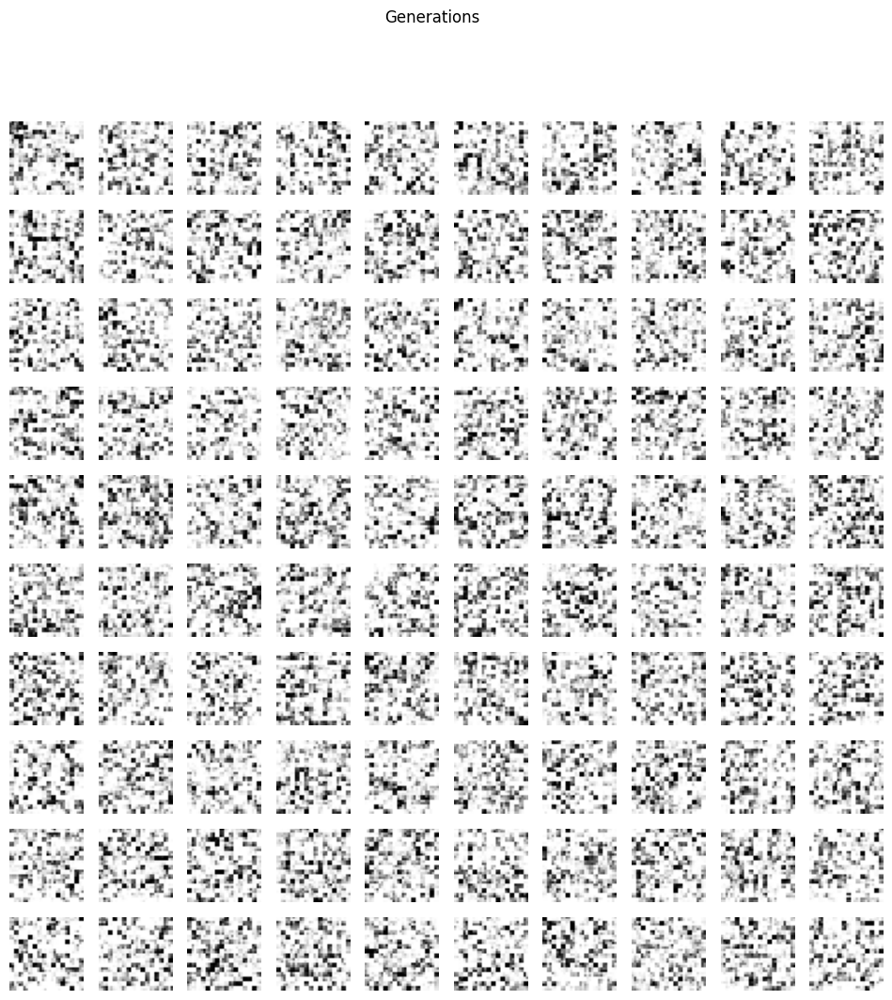

Starting epoch 1... 	Time taken: 74.19 seconds
	Metrics:
		val_negative_log_likelihood: -2.19183
		train_negative_log_likelihood: -1.19532
	LR is now 0.0001999959716

Starting epoch 2... 	Time taken: 55.19 seconds
	Metrics:
		val_negative_log_likelihood: -2.49439
		train_negative_log_likelihood: -2.39163
	LR is now 0.0001999838868

Starting epoch 3... 	Time taken: 56.2 seconds
	Metrics:
		val_negative_log_likelihood: -2.58835
		train_negative_log_likelihood: -2.5592
	LR is now 0.0001999637465

Starting epoch 4... 	Time taken: 55.81 seconds
	Metrics:
		val_negative_log_likelihood: -2.63928
		train_negative_log_likelihood: -2.62345
	LR is now 0.0001999355524

Starting epoch 5... 	Time taken: 55.43 seconds
	Metrics:
		val_negative_log_likelihood: -2.67451
		train_negative_log_likelihood: -2.66652
	LR is now 0.0001998993067

Starting epoch 6... 	Time taken: 55.07 seconds
	Metrics:
		val_negative_log_likelihood: -2.69517
		train_negative_log_likelihood: -2.69697
	LR is now 0.0001998550123



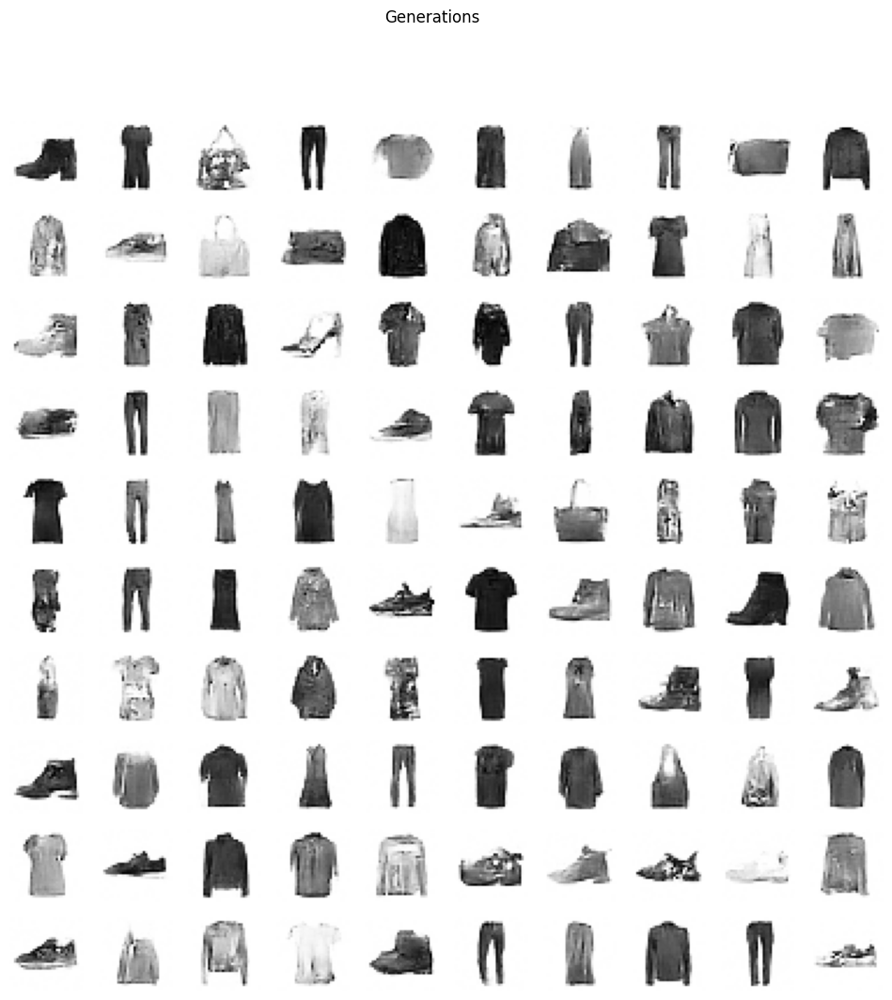

Starting epoch 21... 	Time taken: 56.04 seconds
	Metrics:
		val_negative_log_likelihood: -2.84229
		train_negative_log_likelihood: -2.85618
	LR is now 0.0001982287251

Starting epoch 22... 	Time taken: 55.55 seconds
	Metrics:
		val_negative_log_likelihood: -2.83645
		train_negative_log_likelihood: -2.85799
	LR is now 0.0001980565772

Starting epoch 23... 	Time taken: 56.25 seconds
	Metrics:
		val_negative_log_likelihood: -2.84778
		train_negative_log_likelihood: -2.86443
	LR is now 0.0001978765292

Starting epoch 24... 	Time taken: 56.11 seconds
	Metrics:
		val_negative_log_likelihood: -2.85137
		train_negative_log_likelihood: -2.87004
	LR is now 0.0001976885955

Starting epoch 25... 	Time taken: 62.16 seconds
	Metrics:
		val_negative_log_likelihood: -2.84943
		train_negative_log_likelihood: -2.87164
	LR is now 0.0001974927912

Starting epoch 26... 	Time taken: 56.48 seconds
	Metrics:
		val_negative_log_likelihood: -2.86088
		train_negative_log_likelihood: -2.87617
	LR is now 0.0001972

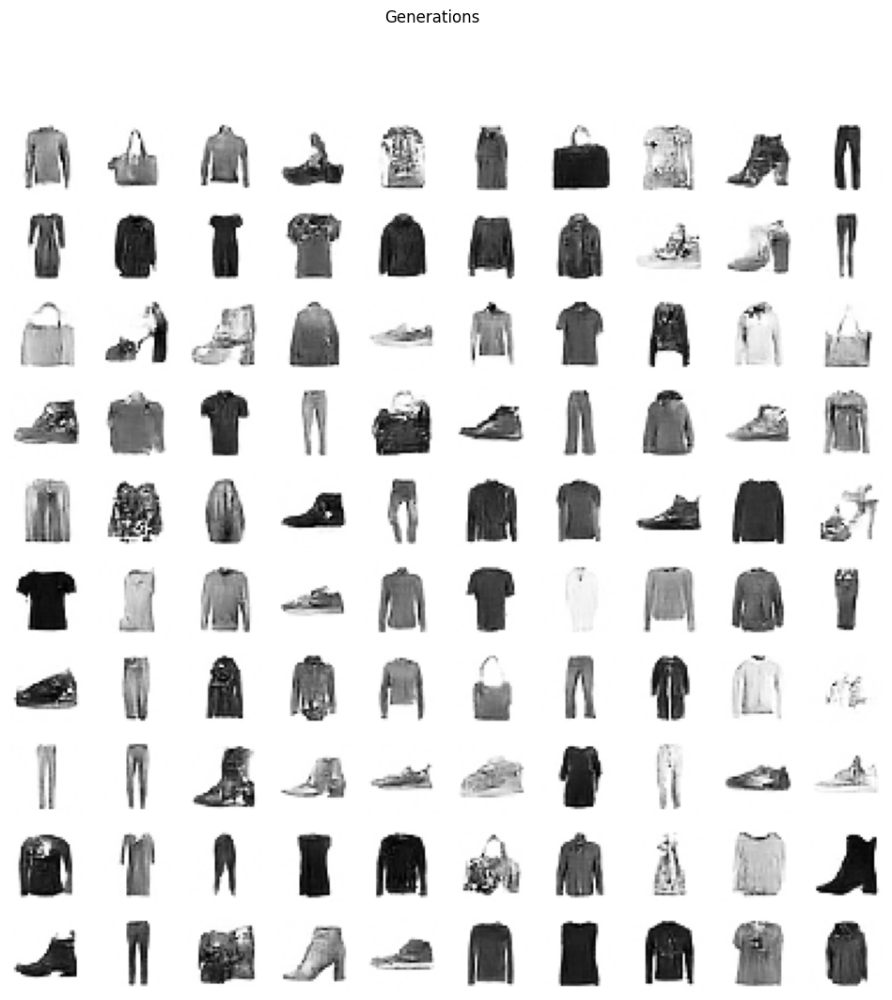

Starting epoch 41... 	Time taken: 56.58 seconds
	Metrics:
		val_negative_log_likelihood: -2.89383
		train_negative_log_likelihood: -2.91804
	LR is now 0.0001933043265

Starting epoch 42... 	Time taken: 56.38 seconds
	Metrics:
		val_negative_log_likelihood: -2.88726
		train_negative_log_likelihood: -2.91718
	LR is now 0.0001929776486

Starting epoch 43... 	Time taken: 56.42 seconds
	Metrics:
		val_negative_log_likelihood: -2.89556
		train_negative_log_likelihood: -2.9218
	LR is now 0.0001926434797

Starting epoch 44... 	Time taken: 56.41 seconds
	Metrics:
		val_negative_log_likelihood: -2.89755
		train_negative_log_likelihood: -2.92355
	LR is now 0.0001923018468

Starting epoch 45... 	Time taken: 55.36 seconds
	Metrics:
		val_negative_log_likelihood: -2.87129
		train_negative_log_likelihood: -2.92603
	LR is now 0.0001919527773

Starting epoch 46... 	Time taken: 56.39 seconds
	Metrics:
		val_negative_log_likelihood: -2.89034
		train_negative_log_likelihood: -2.92577
	LR is now 0.00019159

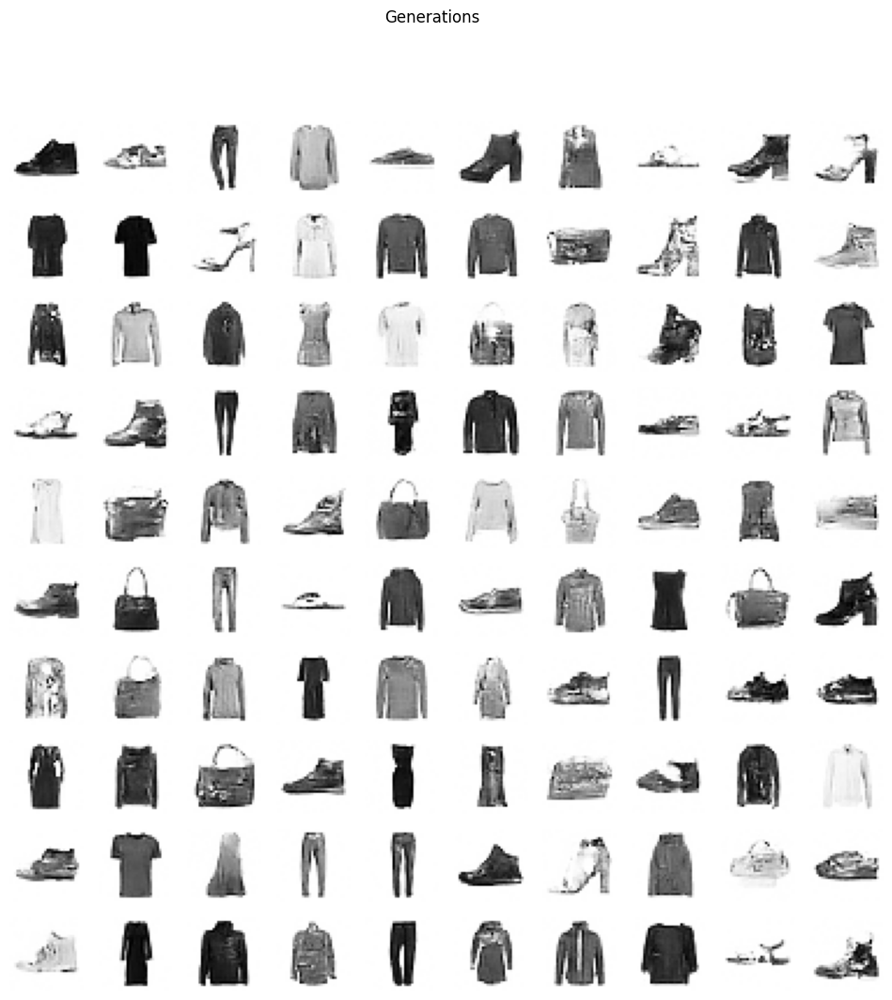

Starting epoch 61... 	Time taken: 55.36 seconds
	Metrics:
		val_negative_log_likelihood: -2.91228
		train_negative_log_likelihood: -2.94943
	LR is now 0.0001853810501

Starting epoch 62... 	Time taken: 56.83 seconds
	Metrics:
		val_negative_log_likelihood: -2.91788
		train_negative_log_likelihood: -2.95159
	LR is now 0.0001849103418

Starting epoch 63... 	Time taken: 56.05 seconds
	Metrics:
		val_negative_log_likelihood: -2.91693
		train_negative_log_likelihood: -2.95285
	LR is now 0.0001844327926

Starting epoch 64... 	Time taken: 56.84 seconds
	Metrics:
		val_negative_log_likelihood: -2.91214
		train_negative_log_likelihood: -2.95356
	LR is now 0.0001839484407

Starting epoch 65... 	Time taken: 55.95 seconds
	Metrics:
		val_negative_log_likelihood: -2.91986
		train_negative_log_likelihood: -2.95521
	LR is now 0.0001834573254

Starting epoch 66... 	Time taken: 56.04 seconds
	Metrics:
		val_negative_log_likelihood: -2.91028
		train_negative_log_likelihood: -2.95738
	LR is now 0.0001829

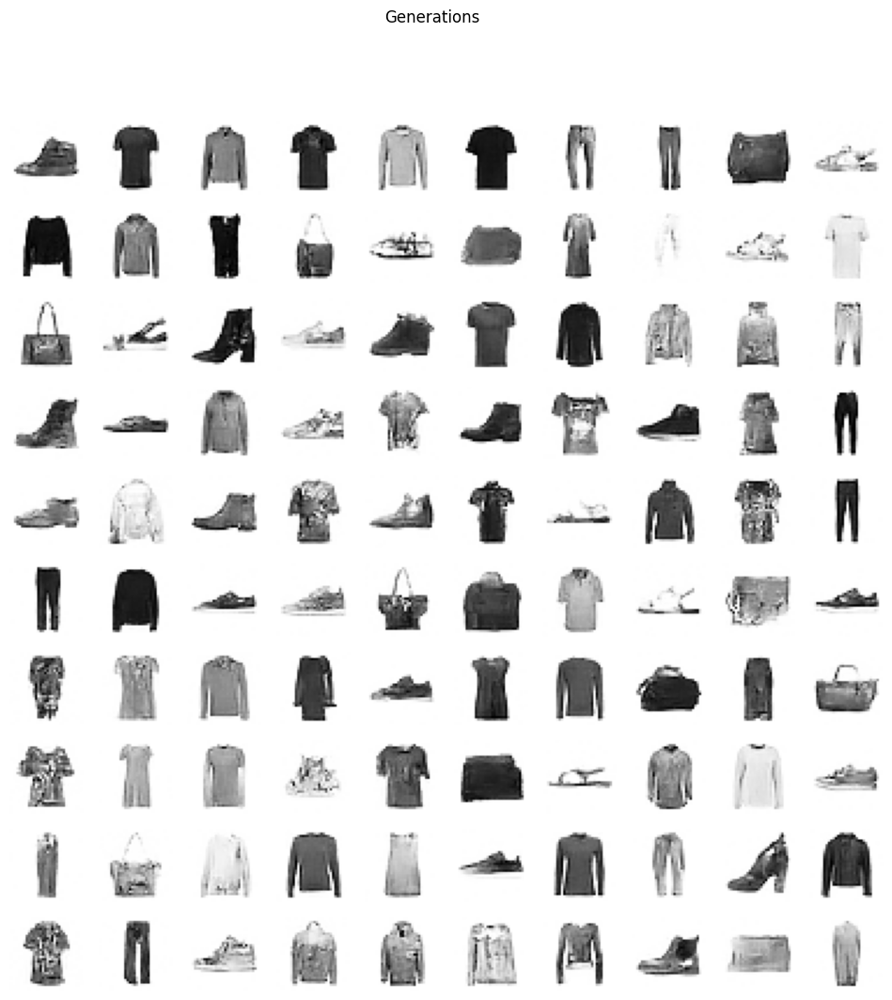

Starting epoch 81... 	Time taken: 57.05 seconds
	Metrics:
		val_negative_log_likelihood: -2.93479
		train_negative_log_likelihood: -2.98219
	LR is now 0.0001747135565

Starting epoch 82... 	Time taken: 55.73 seconds
	Metrics:
		val_negative_log_likelihood: -2.93144
		train_negative_log_likelihood: -2.98452
	LR is now 0.0001741139468

Starting epoch 83... 	Time taken: 54.85 seconds
	Metrics:
		val_negative_log_likelihood: -2.93346
		train_negative_log_likelihood: -2.98579
	LR is now 0.000173508366

Starting epoch 84... 	Time taken: 59.79 seconds
	Metrics:
		val_negative_log_likelihood: -2.93549
		train_negative_log_likelihood: -2.98794
	LR is now 0.0001728968627

Starting epoch 85... 	Time taken: 55.94 seconds
	Metrics:
		val_negative_log_likelihood: -2.93856
		train_negative_log_likelihood: -2.98714
	LR is now 0.0001722794864

Starting epoch 86... 	Time taken: 55.28 seconds
	Metrics:
		val_negative_log_likelihood: -2.93535
		train_negative_log_likelihood: -2.9911
	LR is now 0.000171656

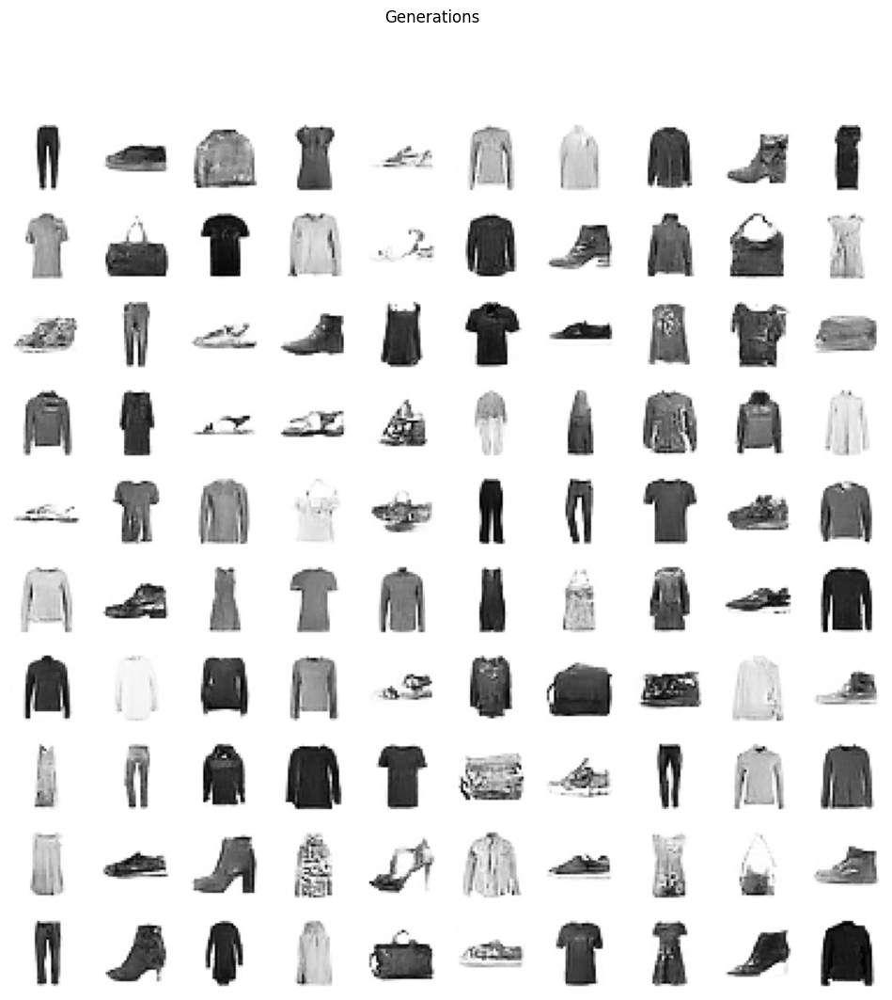

Starting epoch 101... 	Time taken: 55.7 seconds
	Metrics:
		val_negative_log_likelihood: -2.93165
		train_negative_log_likelihood: -3.00252
	LR is now 0.0001616447077

Starting epoch 102... 	Time taken: 56.75 seconds
	Metrics:
		val_negative_log_likelihood: -2.94148
		train_negative_log_likelihood: -3.00569
	LR is now 0.0001609354686

Starting epoch 103... 	Time taken: 55.8 seconds
	Metrics:
		val_negative_log_likelihood: -2.92241
		train_negative_log_likelihood: -3.00633
	LR is now 0.00016022132

Starting epoch 104... 	Time taken: 55.75 seconds
	Metrics:
		val_negative_log_likelihood: -2.93808
		train_negative_log_likelihood: -3.00965
	LR is now 0.0001595023196

Starting epoch 105... 	Time taken: 56.72 seconds
	Metrics:
		val_negative_log_likelihood: -2.93351
		train_negative_log_likelihood: -3.0082
	LR is now 0.0001587785252

Starting epoch 106... 	Time taken: 56.27 seconds
	Metrics:
		val_negative_log_likelihood: -2.93451
		train_negative_log_likelihood: -3.01061
	LR is now 0.000158

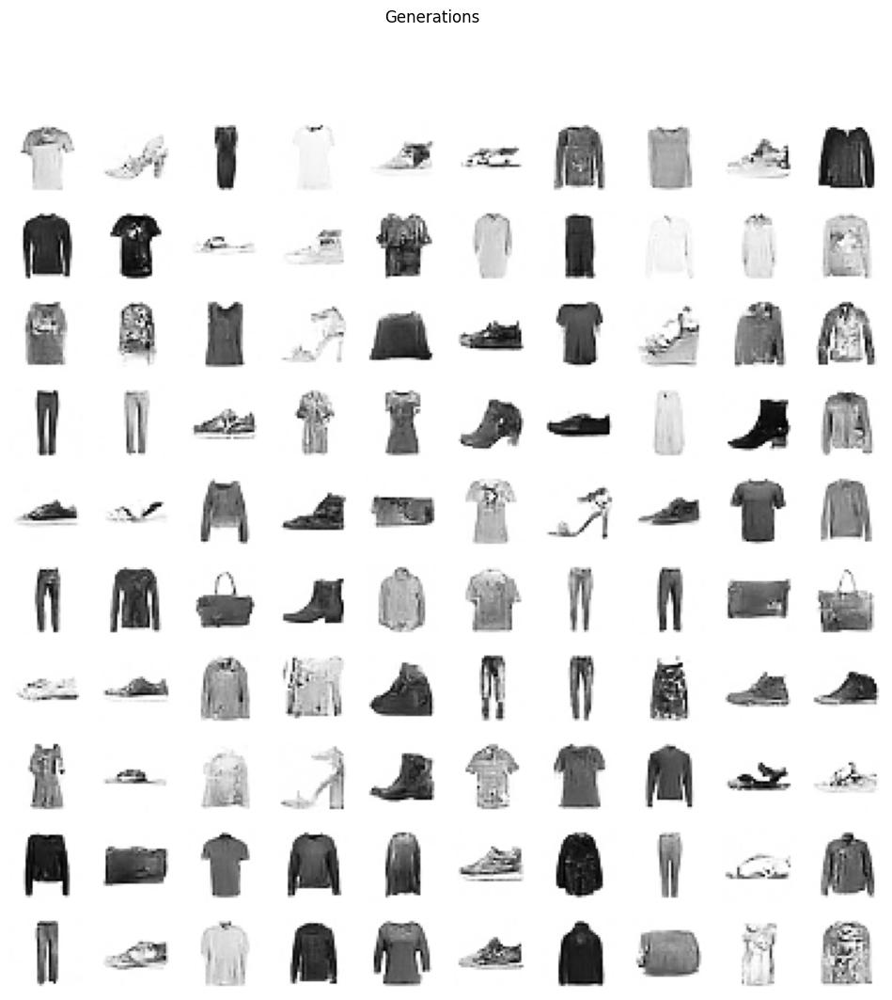

Starting epoch 121... 	Time taken: 54.63 seconds
	Metrics:
		val_negative_log_likelihood: -2.93626
		train_negative_log_likelihood: -3.02147
	LR is now 0.0001465945472

Starting epoch 122... 	Time taken: 54.92 seconds
	Metrics:
		val_negative_log_likelihood: -2.93929
		train_negative_log_likelihood: -3.0216
	LR is now 0.0001457984742

Starting epoch 123... 	Time taken: 53.13 seconds
	Metrics:
		val_negative_log_likelihood: -2.93881
		train_negative_log_likelihood: -3.02319
	LR is now 0.0001449987113

Starting epoch 124... 	Time taken: 55.02 seconds
	Metrics:
		val_negative_log_likelihood: -2.93652
		train_negative_log_likelihood: -3.02264
	LR is now 0.000144195323

Starting epoch 125... 	Time taken: 54.56 seconds
	Metrics:
		val_negative_log_likelihood: -2.93908
		train_negative_log_likelihood: -3.0246
	LR is now 0.0001433883739

Starting epoch 126... 	Time taken: 54.1 seconds
	Metrics:
		val_negative_log_likelihood: -2.90863
		train_negative_log_likelihood: -3.02336
	LR is now 0.00014

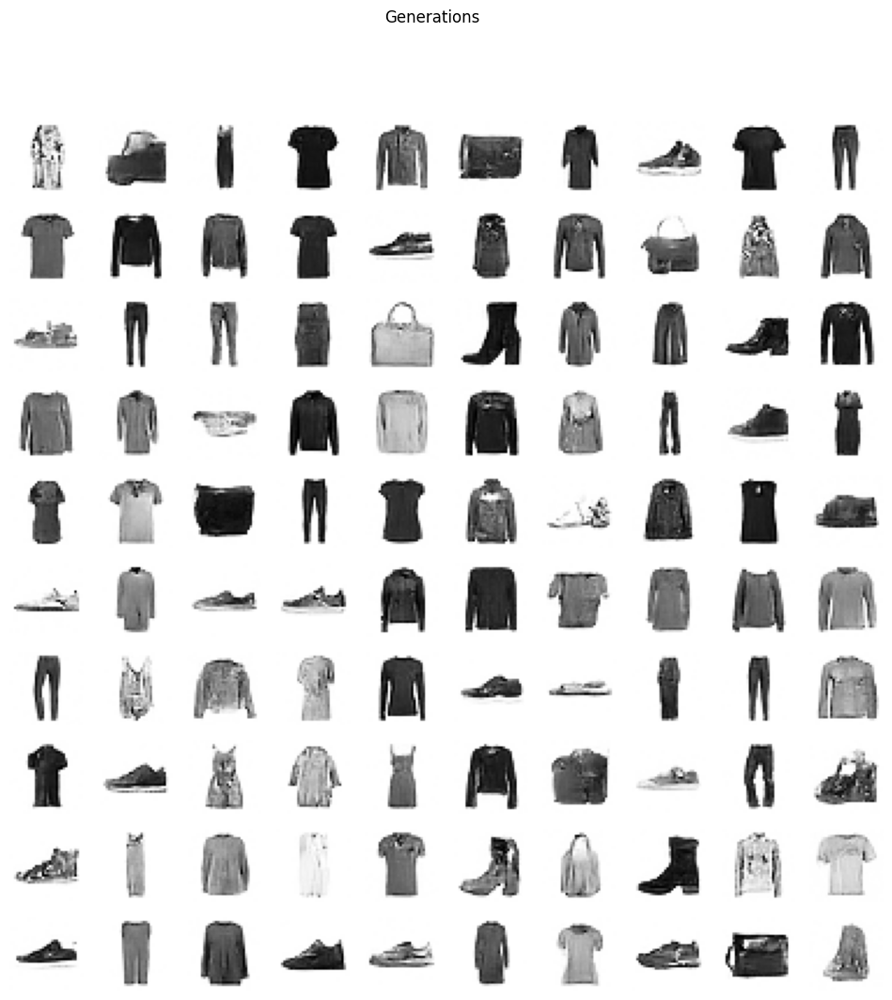

Starting epoch 141... 	Time taken: 53.58 seconds
	Metrics:
		val_negative_log_likelihood: -2.90925
		train_negative_log_likelihood: -3.03341
	LR is now 0.0001300467997

Starting epoch 142... 	Time taken: 54.52 seconds
	Metrics:
		val_negative_log_likelihood: -2.93169
		train_negative_log_likelihood: -3.03597
	LR is now 0.0001291894792

Starting epoch 143... 	Time taken: 53.53 seconds
	Metrics:
		val_negative_log_likelihood: -2.92507
		train_negative_log_likelihood: -3.03615
	LR is now 0.000128329807

Starting epoch 144... 	Time taken: 57.08 seconds
	Metrics:
		val_negative_log_likelihood: -2.91852
		train_negative_log_likelihood: -3.03532
	LR is now 0.0001274678523

Starting epoch 145... 	Time taken: 60.47 seconds
	Metrics:
		val_negative_log_likelihood: -2.92669
		train_negative_log_likelihood: -3.03581
	LR is now 0.0001266036846

Starting epoch 146... 	Time taken: 55.45 seconds
	Metrics:
		val_negative_log_likelihood: -2.93229
		train_negative_log_likelihood: -3.03899
	LR is now 0.00

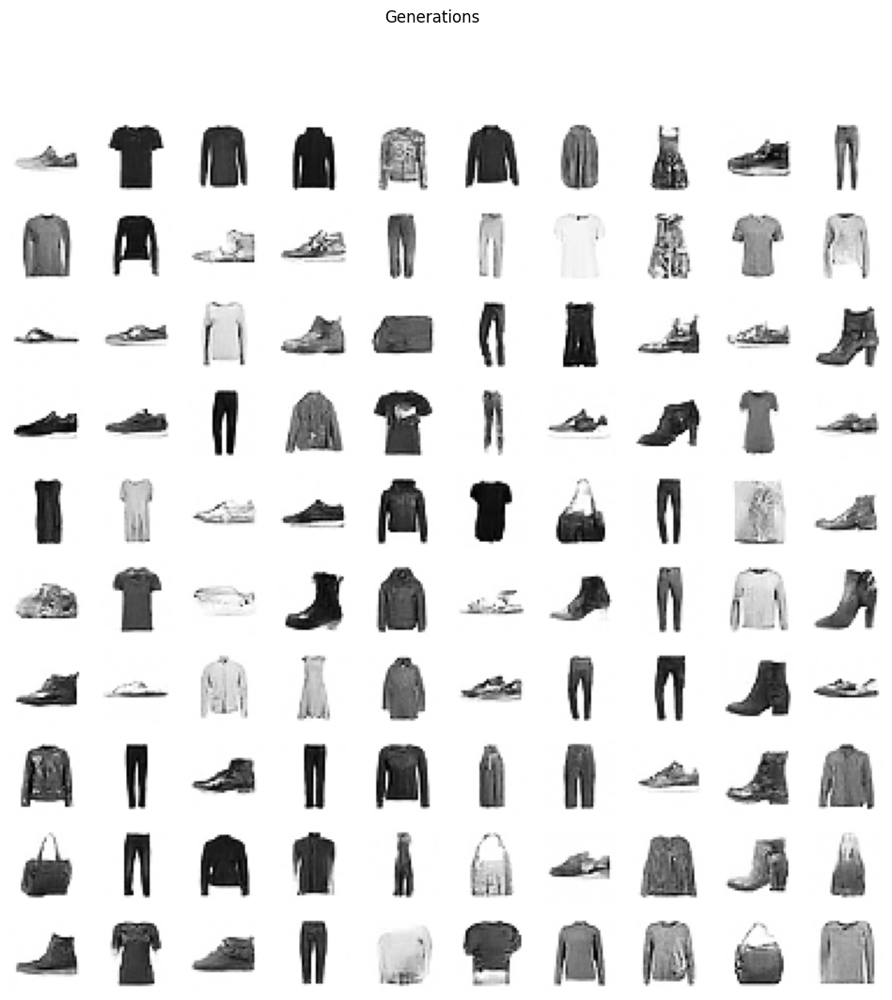

Starting epoch 161... 	Time taken: 53.24 seconds
	Metrics:
		val_negative_log_likelihood: -2.91693
		train_negative_log_likelihood: -3.04783
	LR is now 0.0001125333234

Starting epoch 162... 	Time taken: 54.57 seconds
	Metrics:
		val_negative_log_likelihood: -2.91788
		train_negative_log_likelihood: -3.04443
	LR is now 0.0001116423104

Starting epoch 163... 	Time taken: 52.65 seconds
	Metrics:
		val_negative_log_likelihood: -2.91917
		train_negative_log_likelihood: -3.04811
	LR is now 0.0001107503594

Starting epoch 164... 	Time taken: 54.23 seconds
	Metrics:
		val_negative_log_likelihood: -2.91876
		train_negative_log_likelihood: -3.04865
	LR is now 0.0001098575422

Starting epoch 165... 	Time taken: 55.55 seconds
	Metrics:
		val_negative_log_likelihood: -2.92016
		train_negative_log_likelihood: -3.04773
	LR is now 0.0001089639309

Starting epoch 166... 	Time taken: 54.39 seconds
	Metrics:
		val_negative_log_likelihood: -2.92388
		train_negative_log_likelihood: -3.04786
	LR is now 0.0

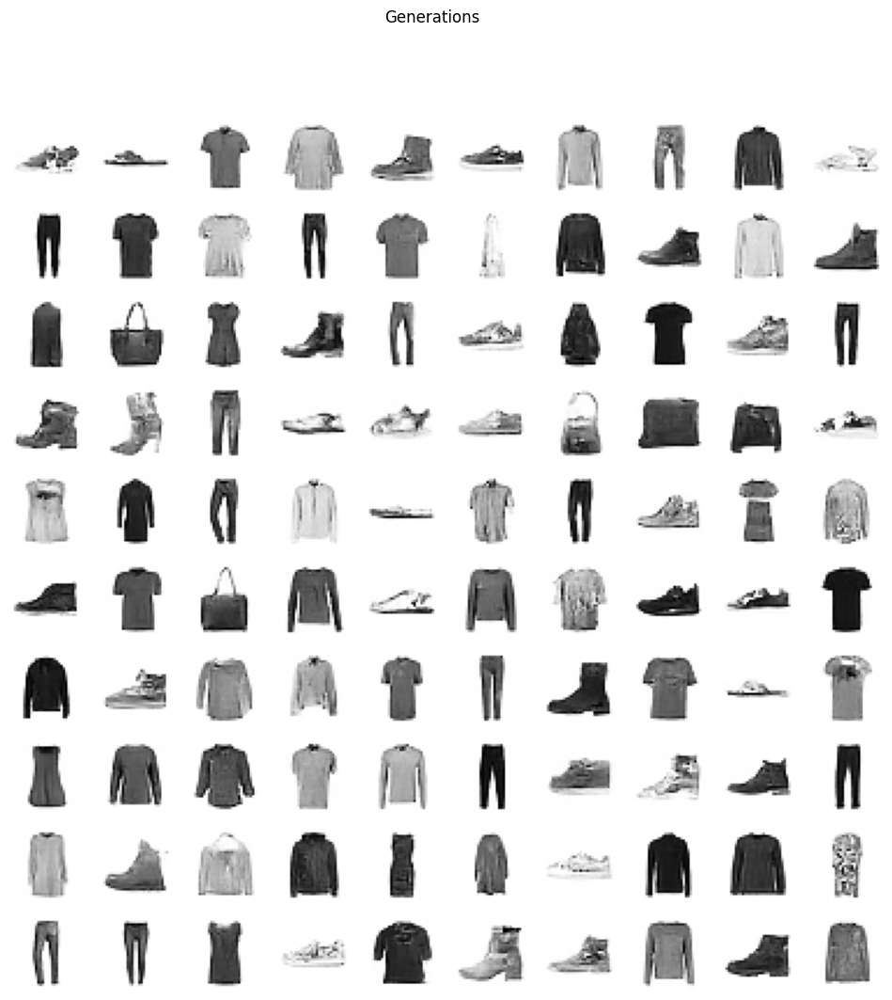

Starting epoch 181... 	Time taken: 60.13 seconds
	Metrics:
		val_negative_log_likelihood: -2.91269
		train_negative_log_likelihood: -3.05919
	LR is now 9.461701566e-05

Starting epoch 182... 	Time taken: 55.21 seconds
	Metrics:
		val_negative_log_likelihood: -2.8974
		train_negative_log_likelihood: -3.05736
	LR is now 9.372094805e-05

Starting epoch 183... 	Time taken: 54.05 seconds
	Metrics:
		val_negative_log_likelihood: -2.90818
		train_negative_log_likelihood: -3.05714
	LR is now 9.282538632e-05

Starting epoch 184... 	Time taken: 51.48 seconds
	Metrics:
		val_negative_log_likelihood: -2.90535
		train_negative_log_likelihood: -3.06094
	LR is now 9.193040264e-05

Starting epoch 185... 	Time taken: 53.6 seconds
	Metrics:
		val_negative_log_likelihood: -2.9095
		train_negative_log_likelihood: -3.06005
	LR is now 9.103606911e-05

Starting epoch 186... 	Time taken: 54.15 seconds
	Metrics:
		val_negative_log_likelihood: -2.9066
		train_negative_log_likelihood: -3.06153
	LR is now 9.01424

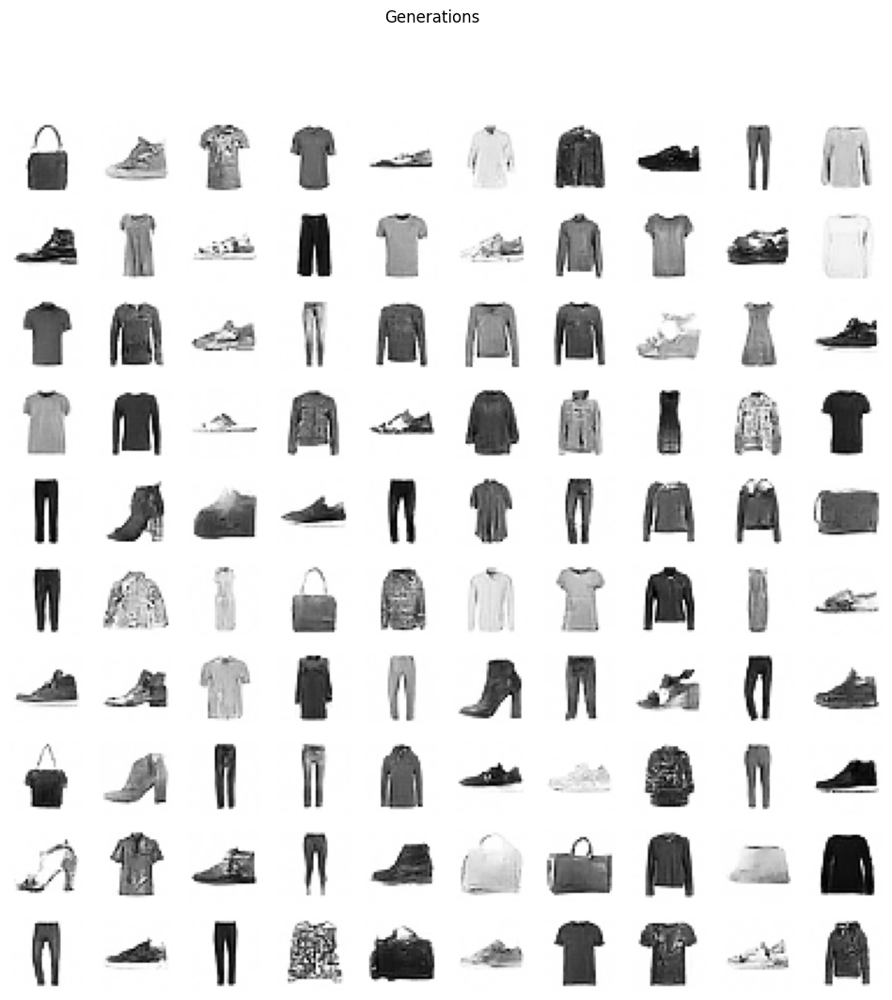

Starting epoch 201... 	Time taken: 56.94 seconds
	Metrics:
		val_negative_log_likelihood: -2.89774
		train_negative_log_likelihood: -3.06987
	LR is now 7.687372151e-05

Starting epoch 202... 	Time taken: 56.09 seconds
	Metrics:
		val_negative_log_likelihood: -2.89128
		train_negative_log_likelihood: -3.07091
	LR is now 7.600139964e-05

Starting epoch 203... 	Time taken: 57.31 seconds
	Metrics:
		val_negative_log_likelihood: -2.90244
		train_negative_log_likelihood: -3.06982
	LR is now 7.513101128e-05

Starting epoch 204... 	Time taken: 56.35 seconds
	Metrics:
		val_negative_log_likelihood: -2.8983
		train_negative_log_likelihood: -3.0719
	LR is now 7.426262656e-05

Starting epoch 205... 	Time taken: 55.94 seconds
	Metrics:
		val_negative_log_likelihood: -2.90003
		train_negative_log_likelihood: -3.07054
	LR is now 7.339631544e-05

Starting epoch 206... 	Time taken: 57.76 seconds
	Metrics:
		val_negative_log_likelihood: -2.90314
		train_negative_log_likelihood: -3.07339
	LR is now 7.253

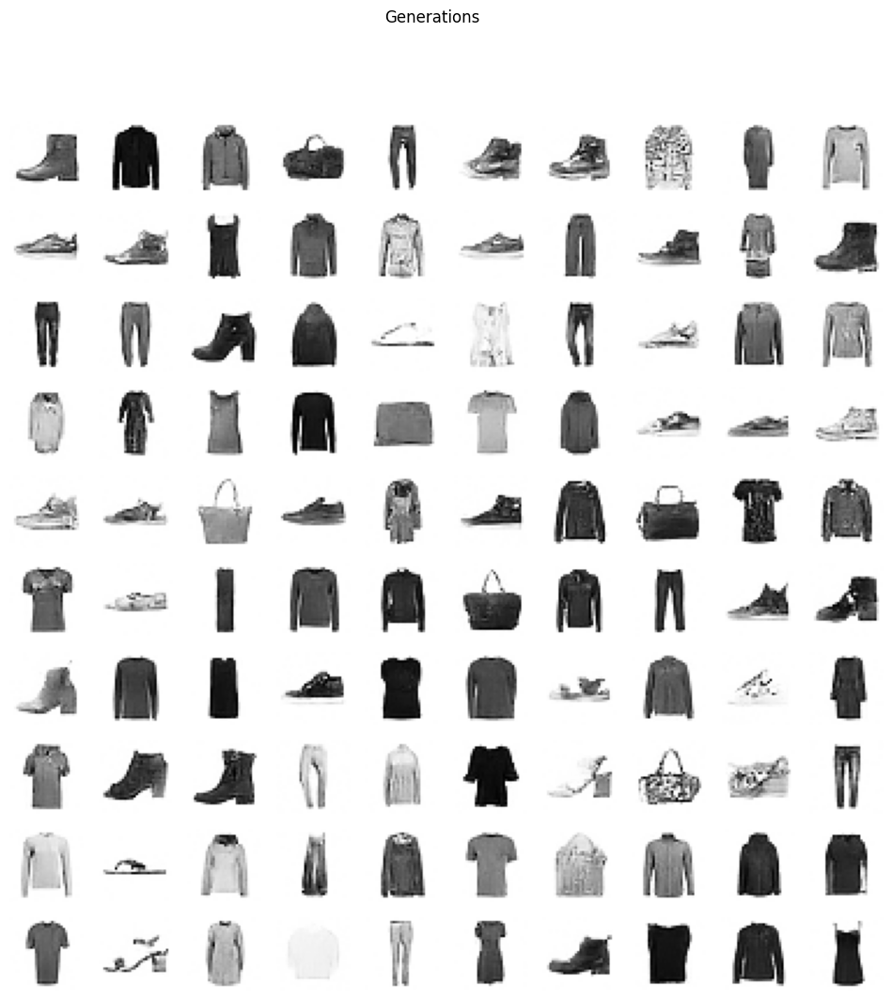

Starting epoch 221... 	Time taken: 56.94 seconds
	Metrics:
		val_negative_log_likelihood: -2.88734
		train_negative_log_likelihood: -3.08105
	LR is now 5.987372497e-05

Starting epoch 222... 	Time taken: 53.83 seconds
	Metrics:
		val_negative_log_likelihood: -2.88554
		train_negative_log_likelihood: -3.08071
	LR is now 5.905318599e-05

Starting epoch 223... 	Time taken: 54.65 seconds
	Metrics:
		val_negative_log_likelihood: -2.88865
		train_negative_log_likelihood: -3.08248
	LR is now 5.8235946e-05

Starting epoch 224... 	Time taken: 58.23 seconds
	Metrics:
		val_negative_log_likelihood: -2.87983
		train_negative_log_likelihood: -3.08175
	LR is now 5.742207084e-05

Starting epoch 225... 	Time taken: 54.87 seconds
	Metrics:
		val_negative_log_likelihood: -2.88093
		train_negative_log_likelihood: -3.08306
	LR is now 5.661162609e-05

Starting epoch 226... 	Time taken: 57.71 seconds
	Metrics:
		val_negative_log_likelihood: -2.88476
		train_negative_log_likelihood: -3.08372
	LR is now 5.580

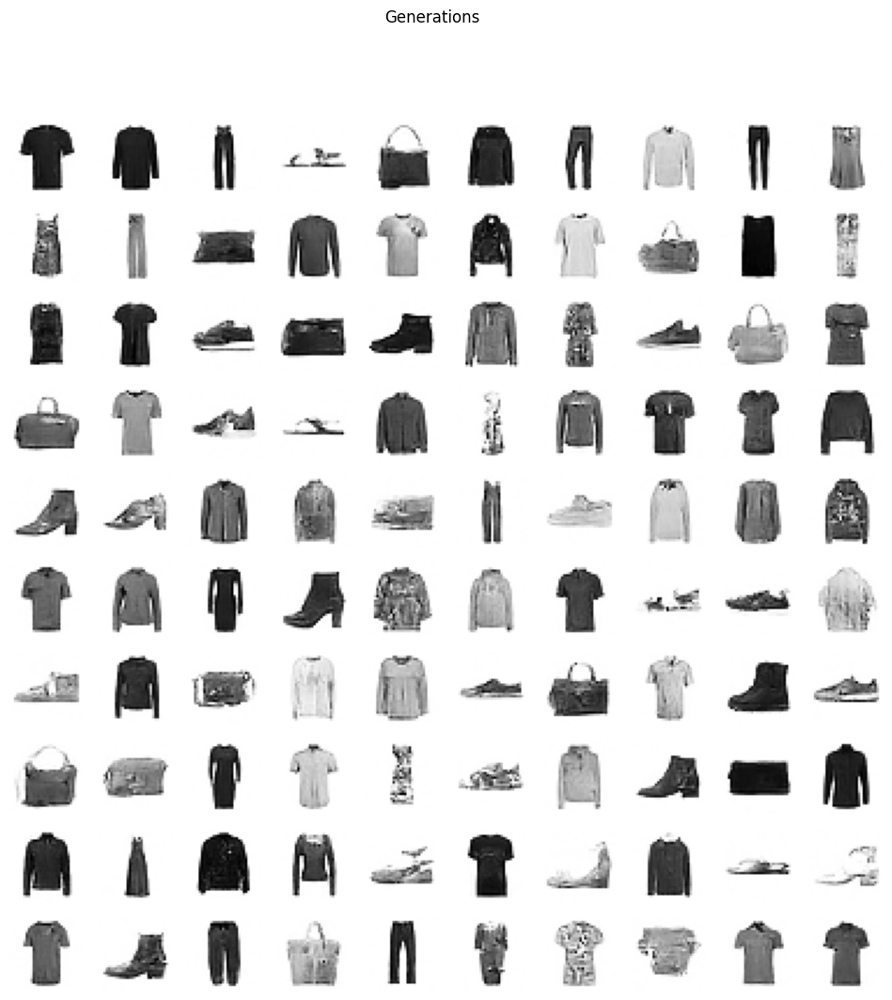

Starting epoch 341... 	Time taken: 58.22 seconds
	Metrics:
		val_negative_log_likelihood: -2.79778
		train_negative_log_likelihood: -3.12204
	LR is now 3.261237912e-07

Starting epoch 342... 	Time taken: 58.23 seconds
	Metrics:
		val_negative_log_likelihood: -2.79709
		train_negative_log_likelihood: -3.12221
	LR is now 2.577074727e-07

Starting epoch 343... 	Time taken: 57.2 seconds
	Metrics:
		val_negative_log_likelihood: -2.79785
		train_negative_log_likelihood: -3.12231
	LR is now 1.973271572e-07

Starting epoch 344... 	Time taken: 56.76 seconds
	Metrics:
		val_negative_log_likelihood: -2.79766
		train_negative_log_likelihood: -3.12223
	LR is now 1.449877093e-07

Starting epoch 345... 	Time taken: 57.48 seconds
	Metrics:
		val_negative_log_likelihood: -2.79742
		train_negative_log_likelihood: -3.12229
	LR is now 1.006933459e-07

Starting epoch 346... 	Time taken: 56.27 seconds
	Metrics:
		val_negative_log_likelihood: -2.79741
		train_negative_log_likelihood: -3.12217
	LR is now 6.44

In [22]:
metrics = trainer.train_model()

## Evaluation

First all the standard stuff.

In [23]:
trainer.evaluate()

(tensor(-2.7976, device='cuda:0'),
 defaultdict(float,
             {'negative_log_likelihood': tensor(-2.7976, device='cuda:0')}))

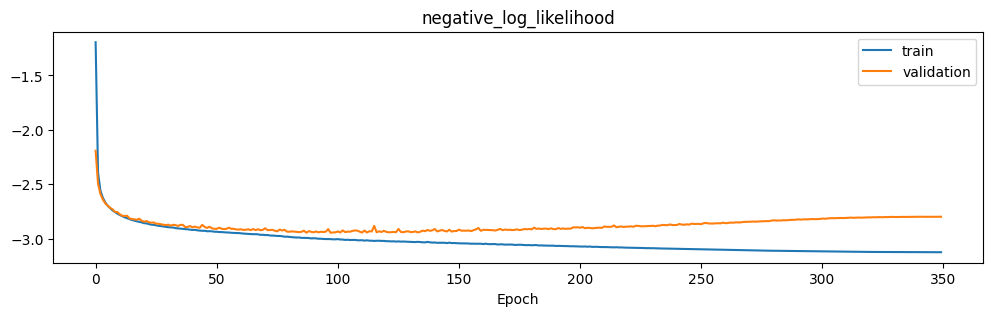

In [24]:
plot_learning_curves(metrics, ["negative_log_likelihood"])

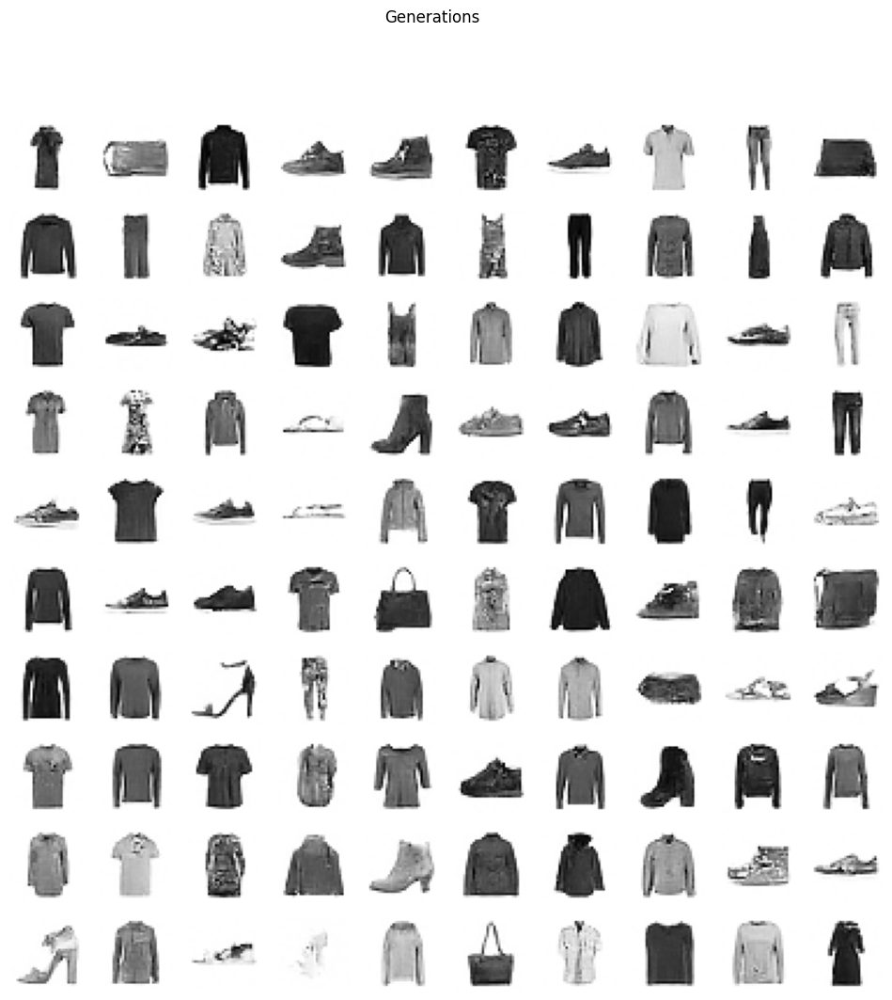

In [25]:
trainer.plot_examples()

In [26]:
classifier = get_classifier(data, "weights").to(device)

feature_extractor = classifier[:-3]
classifier.eval()
feature_extractor.eval()
head = classifier[-3:]
head.eval()


def generate_wrap(n_samples):
    with torch.inference_mode():
        out = torch.clamp(descale_data(model.generate(n_samples)), 0, 1)
        return out

_, _, _, test_dataloader_noscale = get_datasets_and_loaders(data, batch_size, num_workers=16, verbose=False)

In [27]:
fid_score, real_features, generated_features = fid(feature_extractor, test_dataloader_noscale, generate_wrap,
                                                   n_samples=50000, return_features=True, use_tqdm=True)
fid_score

Computing real features:   0%|          | 0/40 [00:00<?, ?it/s]

Computing generated features:   0%|          | 0/196 [00:00<?, ?it/s]

np.float64(19.179254119713278)

In [28]:
inception_score_with_features(head, generated_features, batch_size)

np.float64(6.587299123264187)

In [29]:
precision_recall(real_features, generated_features, batch_size, k=5, use_tqdm=True)

Approximating manifold:   0%|          | 0/40 [00:00<?, ?it/s]

Comparing manifold:   0%|          | 0/196 [00:00<?, ?it/s]

Approximating manifold:   0%|          | 0/196 [00:00<?, ?it/s]

Comparing manifold:   0%|          | 0/40 [00:00<?, ?it/s]

{'precisions': tensor([0.6080, 0.8147, 0.8936, 0.9286, 0.9499]),
 'recalls': tensor([0.4291, 0.6400, 0.7417, 0.8049, 0.8482]),
 'fscores': tensor([0.5031, 0.7169, 0.8106, 0.8623, 0.8962])}

Just like with NICE, we can check whether the data is correctly encoded to vectors with the expected length of standard normal samples.
This tends to look reasonable; on average, the norms are fine.
But we usually observe some outliers on both sides, indicating that not all data samples are transformed to the desired distribution.

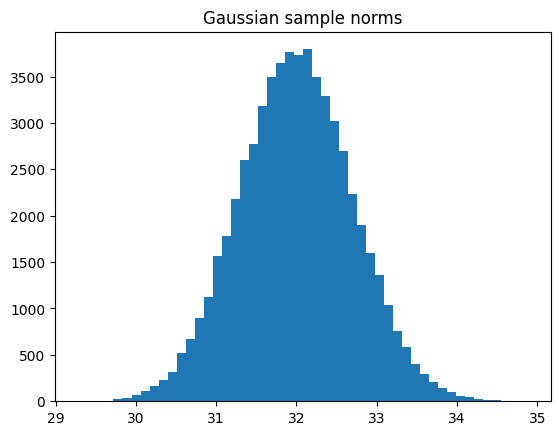

In [30]:
ideal_samples = torch.randn(60000, *input_shape)
ideal_norms = torch.sqrt(sum_except(ideal_samples**2))
plt.hist(ideal_norms, bins=50)
plt.title("Gaussian sample norms")
plt.show()

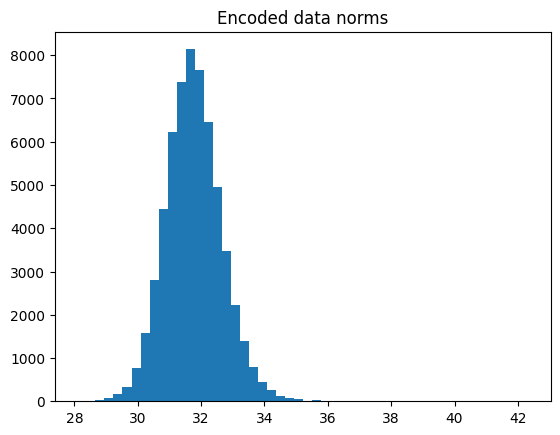

In [31]:
data_norms = []
with torch.inference_mode():
    for batch, _ in train_dataloader:
        simple = model(batch.to(device))[0]
        data_norms.append(torch.sqrt(sum_except(simple**2)))
data_norms = torch.cat(data_norms).cpu().numpy()

plt.hist(data_norms, bins=50)
plt.title("Encoded data norms")
plt.show()

## Temperature

We can also apply temperature sampling. This is proposed as simply multiplying the prior samples by a value < 1. Values around the 0.7 to 0.9 range can often improve results, at the cost of diversity.

In [32]:
def generate_wrap(n_samples, temperature=1.):
    with torch.inference_mode():
        out = model.generate(n_samples, temperature)
        #base = model.base_distribution.sample((n_samples, model.total_dim)).to(device) * temperature
        #out = model.transform_backward(base)
        out = torch.clamp(descale_data(out), 0, 1)
        return out

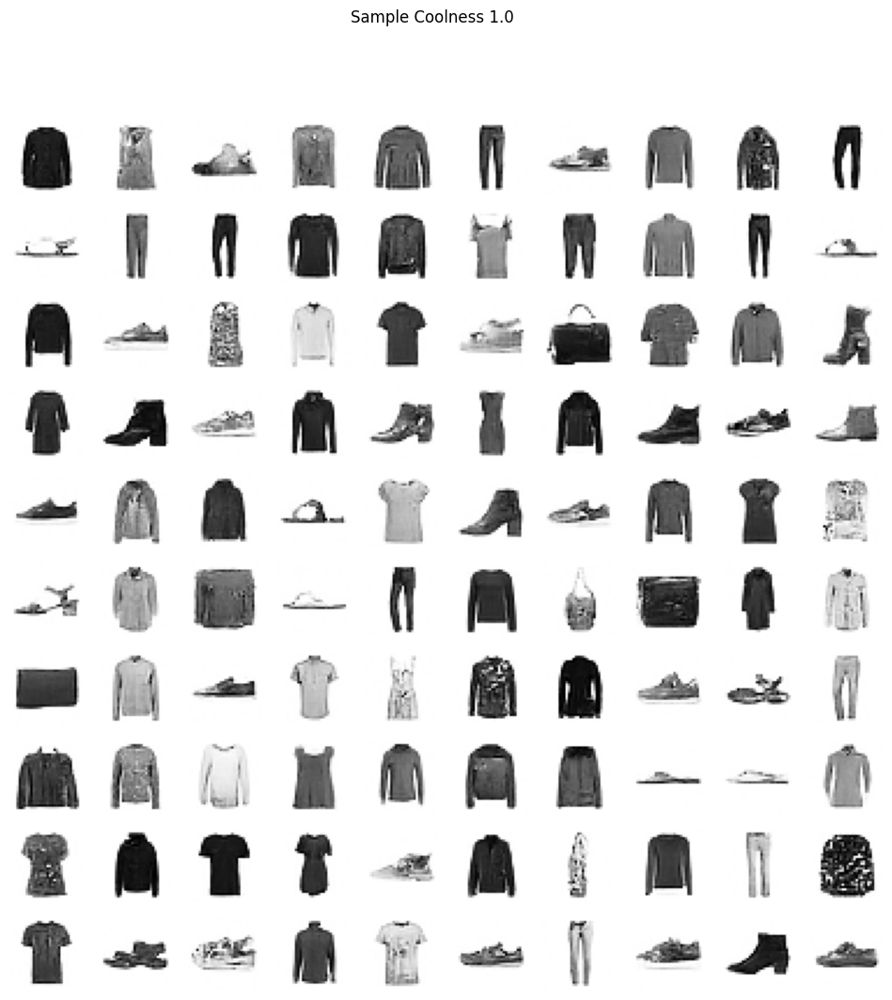

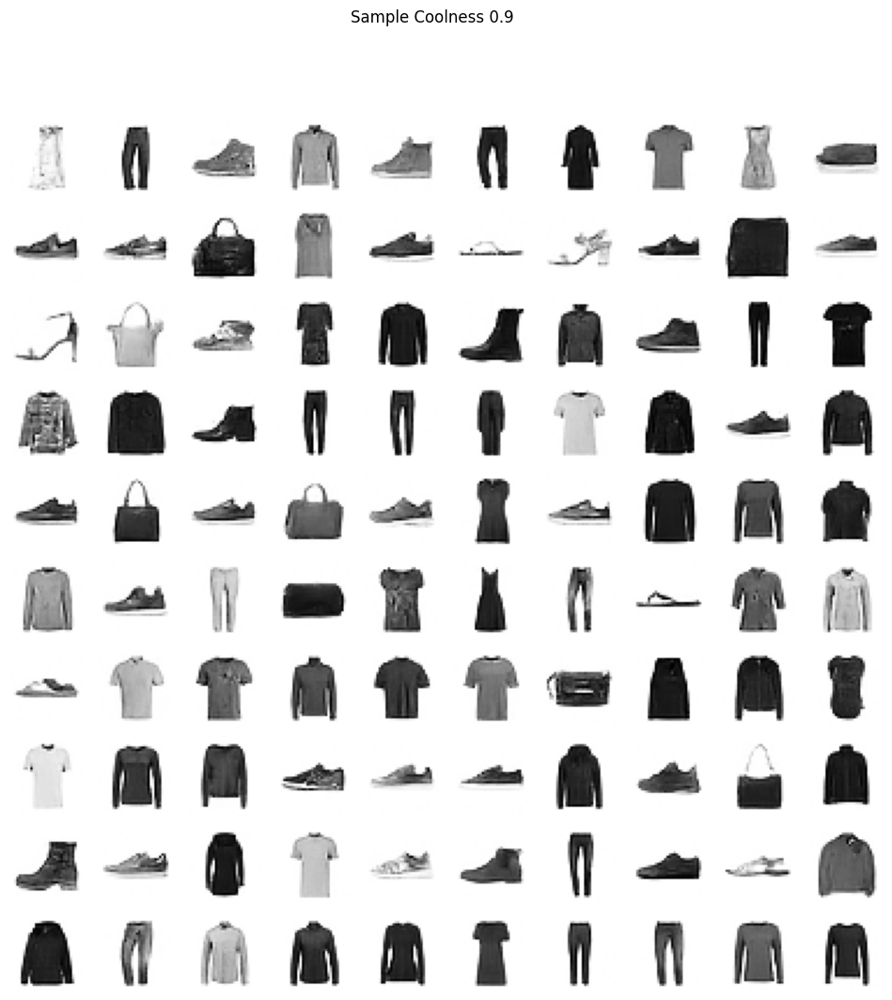

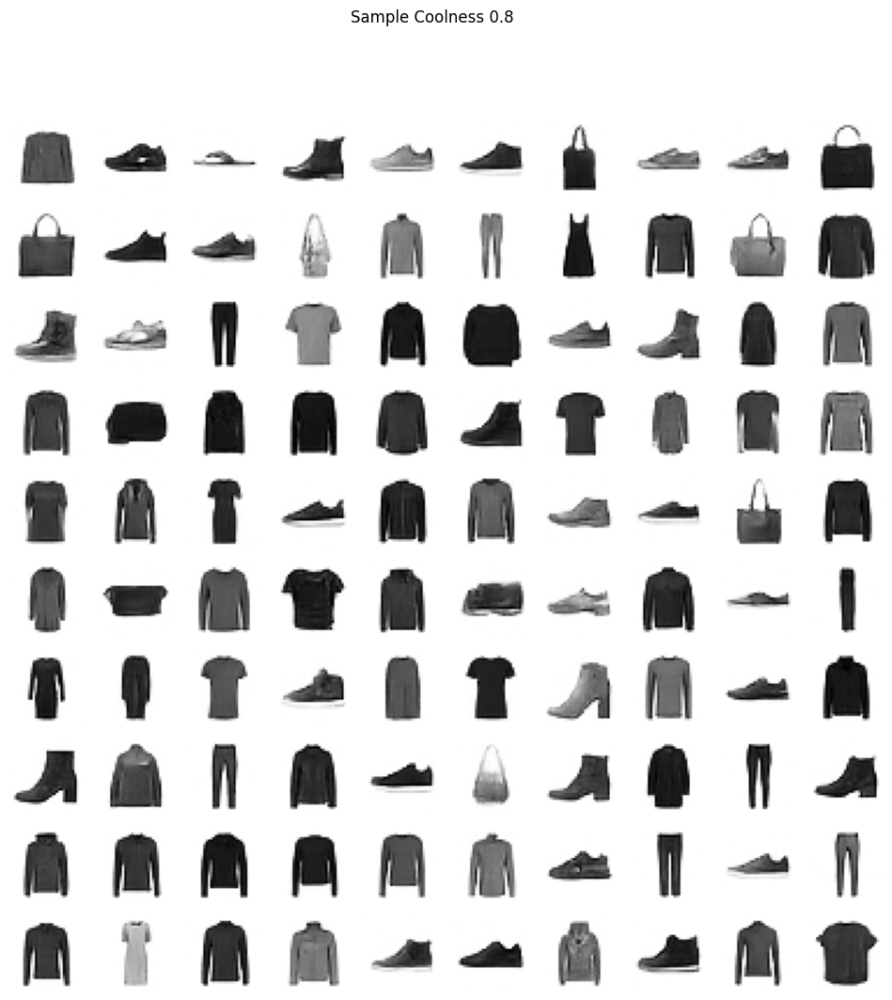

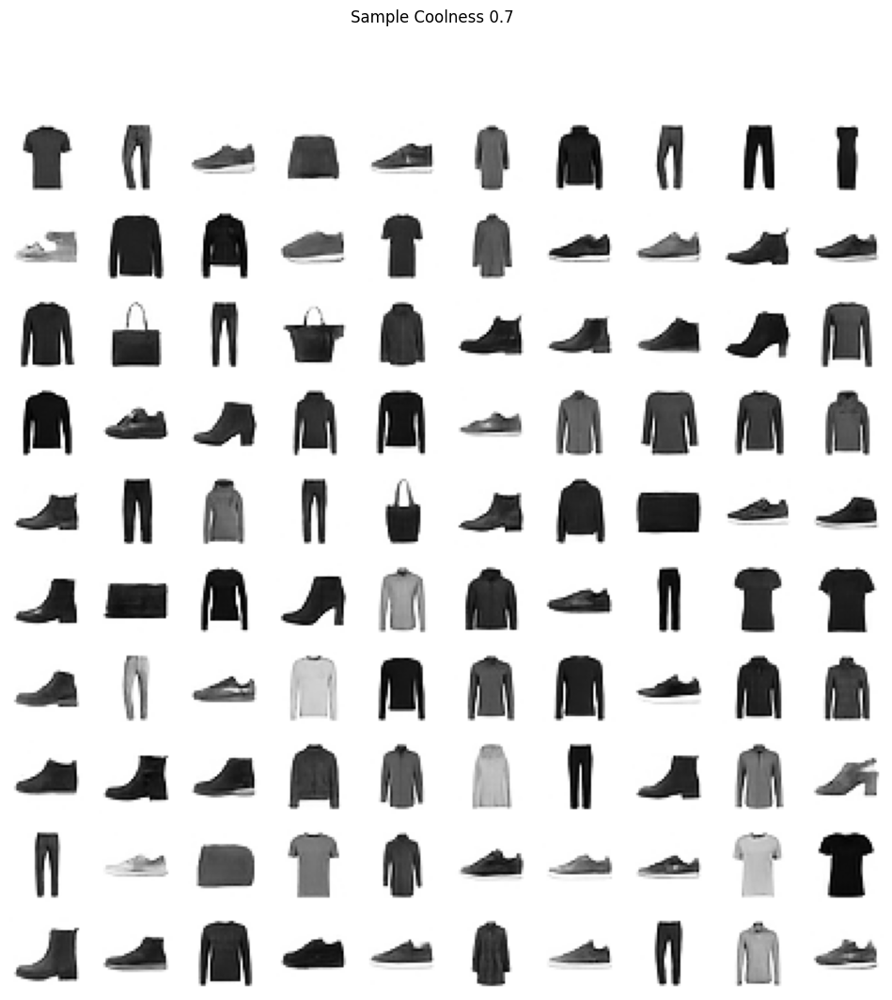

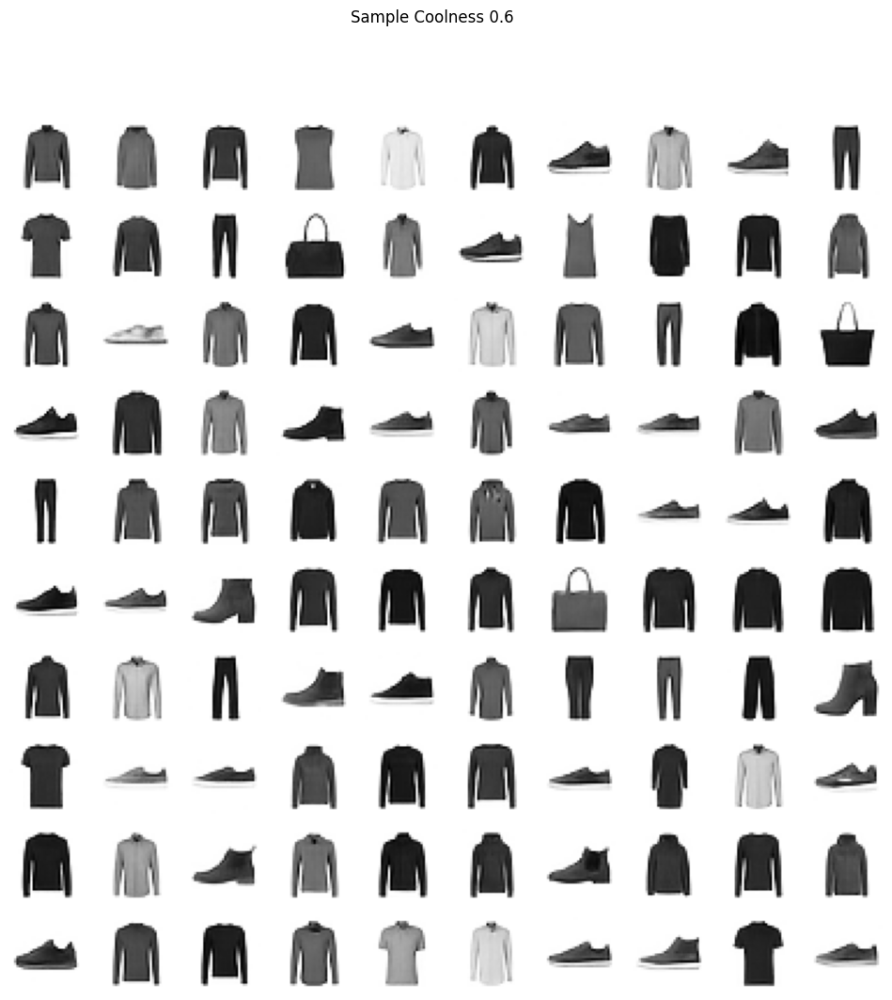

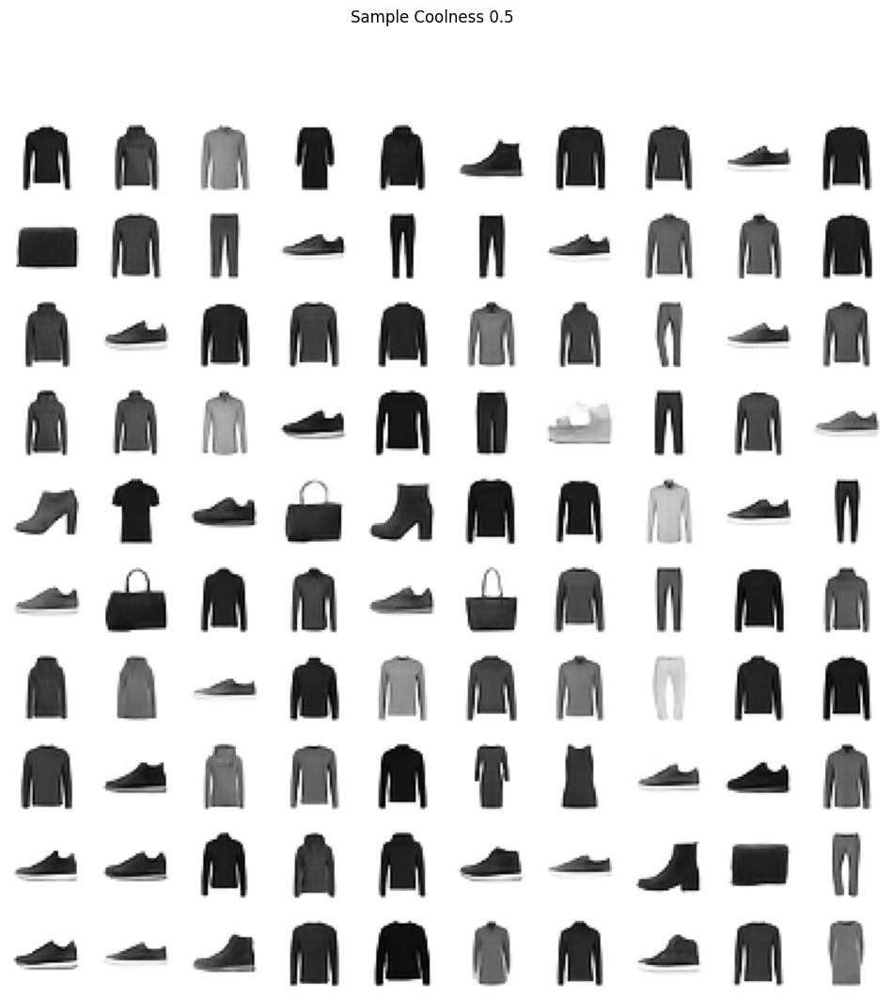

In [33]:
temperatures = [1., 0.9, 0.8, 0.7, 0.6, 0.5]
for temperature in temperatures:
    cool_samples = generate_wrap(100, temperature)
    plot_image_grid(cool_samples, (12, 12), f"Sample Coolness {temperature}", 10)

We can also evaluate the model with each temperature!

In [34]:
for temperature in temperatures:
    print(f"Temperature {temperature}")
    generate_temp = lambda n: generate_wrap(n, temperature=temperature)
    fid_score, real_features, generated_features = fid(feature_extractor, test_dataloader_noscale, generate_temp,
                                                       n_samples=50000, return_features=True, use_tqdm=True)
    inception = inception_score_with_features(head, generated_features, batch_size)
    print(f"FID: {fid_score:.3f}, Inception Score: {inception:.3f}")
    print()

Temperature 1.0


Computing real features:   0%|          | 0/40 [00:00<?, ?it/s]

Computing generated features:   0%|          | 0/196 [00:00<?, ?it/s]

FID: 19.601, Inception Score: 6.590

Temperature 0.9


Computing real features:   0%|          | 0/40 [00:00<?, ?it/s]

Computing generated features:   0%|          | 0/196 [00:00<?, ?it/s]

FID: 17.434, Inception Score: 6.645

Temperature 0.8


Computing real features:   0%|          | 0/40 [00:00<?, ?it/s]

Computing generated features:   0%|          | 0/196 [00:00<?, ?it/s]

FID: 33.775, Inception Score: 6.490

Temperature 0.7


Computing real features:   0%|          | 0/40 [00:00<?, ?it/s]

Computing generated features:   0%|          | 0/196 [00:00<?, ?it/s]

FID: 75.465, Inception Score: 6.030

Temperature 0.6


Computing real features:   0%|          | 0/40 [00:00<?, ?it/s]

Computing generated features:   0%|          | 0/196 [00:00<?, ?it/s]

FID: 148.572, Inception Score: 5.277

Temperature 0.5


Computing real features:   0%|          | 0/40 [00:00<?, ?it/s]

Computing generated features:   0%|          | 0/196 [00:00<?, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



## Applications

In general, we can do more with generative models than just generate samples.

### Out-of-distribution detection
With likelihood-based models, we can compute the "probability" of existing data samples.
These probabilities can be used as an indicator of how likely a sample is from the training distribution.
Low probabilities may indicate that a sample is unusual somehow.

We test this here by "corrupting" data samples in various ways and seeing how the probabilities change. Note that this can also be done with autoregressive models; we just need some way to compute the probabilities.

We show two examples: In the first one, we add Gaussian noise up to a standard deviation of 1 on each pixel.
In the second, we rotate the images up to 180 degrees.
For each example, we first show what the different "corruption levels" look like for one image.
Then, we slowly corrupt one batch of images, and for each image plot the log probability the model assigns to it as it gets corrupted, as well as the average probability.

#### Gaussian Noise
The model seems to react very strongly to noise in the data.
Note that the noise is added directly to the rescaled logits.
A given standard deviation will have a different meaning here versus adding it to the original images!

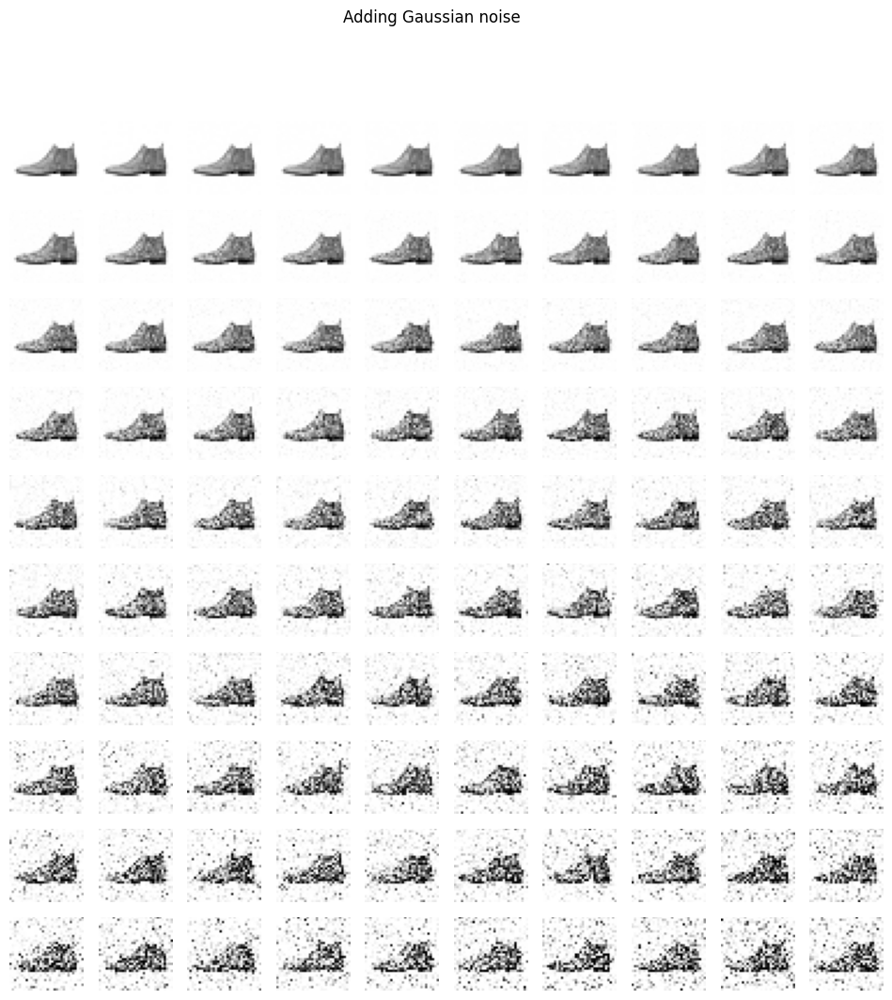

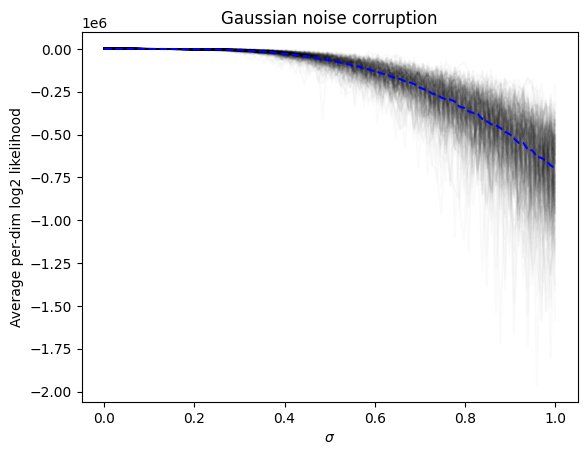

In [35]:
from lgm.flow import corrupt_likelihoods


healthy = next(iter(test_dataloader))[0].to(device)
n_steps = 100
factors = np.linspace(0, 1, n_steps)


def corrupt_noise(samples, factor):
    return samples + torch.randn_like(samples) * factor


corrupt_example_noise = torch.stack([corrupt_noise(test_data[0][0], factor) for factor in factors], dim=0)
plot_image_grid(corrupt_example_noise, figure_size=(12, 12), title="Adding Gaussian noise", n_rows=10,
                plot_descale=descale_data)


corrupted_probs_noise = corrupt_likelihoods(model, healthy, corrupt_noise, n_steps=n_steps)
for line in corrupted_probs_noise:
    plt.plot(factors, line, "k-", alpha=0.02)
plt.plot(factors, corrupted_probs_noise.mean(axis=0), "b--")
plt.xlabel(r"$\sigma$")
plt.ylabel("Average per-dim log2 likelihood")
plt.title("Gaussian noise corruption")
plt.show()

#### Rotations
As for rotations, the model seems to be less sensitive. 
Strangely, it seems 45° rotations are pretty much the worst -- likelihoods increase again from there up to 90°, then decrease again, then increase back to almost unrotated images at 180°.

We have to be careful here:
For most angles (except multiples of 90°), rotation will result in the image being "filled in" in the corners, as the rotated image no longer fits into the square grid.
By default, this is done by the value 0. 
However, if we modify our data through the logit transform and/or normalizing, the original 0 value is no longer actually 0.
So we figure out what a pixel value of 0 gets mapped to by our transformations and use that as the `fill` value in the `rotate` transform.
If you don't do this, probabilities will get significantly worse.
Note, if you removed the logit and/or normalization from the data processing, you will have to modify this, as well.

In [36]:
to_logits = ToLogit(alpha=logit_alpha)
zero_value = scale_data(to_logits(torch.tensor(0.))).item()
print(zero_value)

-0.6926333904266357


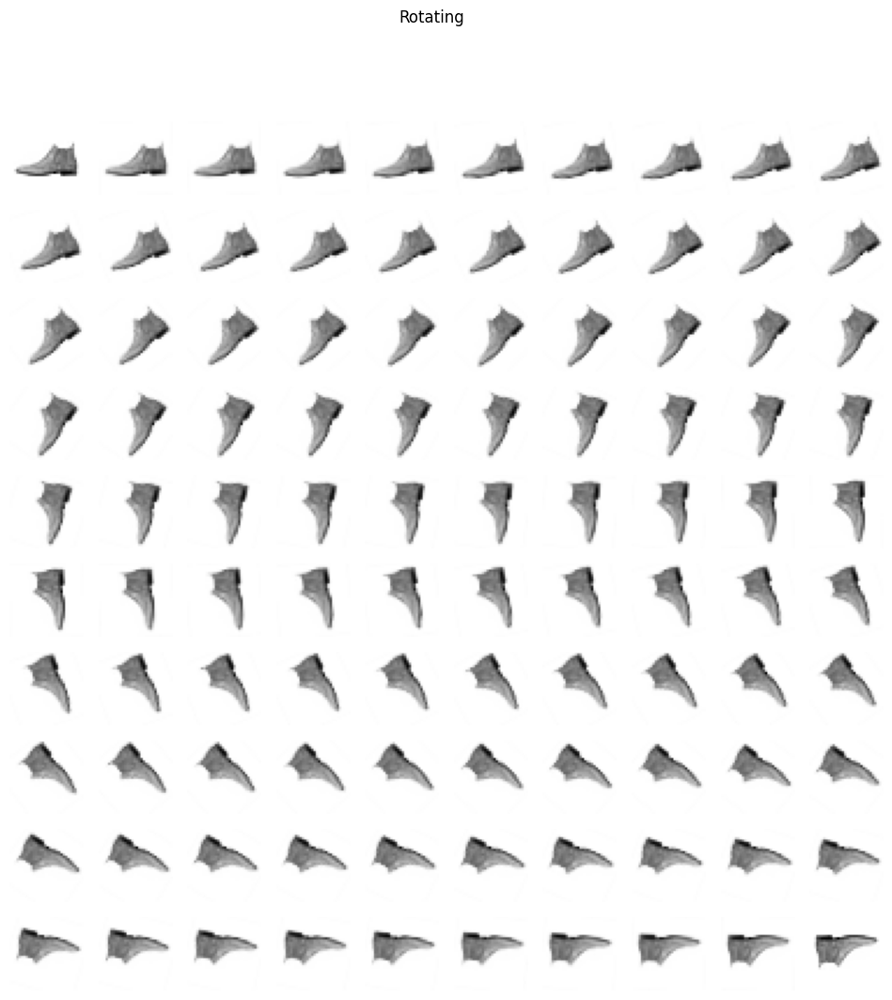

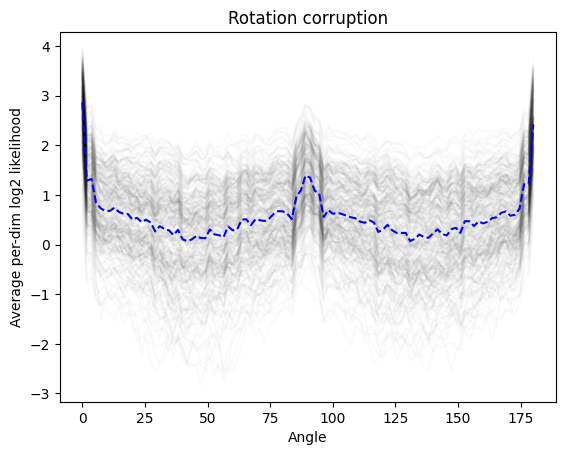

In [37]:
from torchvision.transforms.v2.functional import rotate
from torchvision.transforms.v2 import InterpolationMode


def corrupt_rotate(samples, factor):
    return rotate(samples, angle=180*factor, interpolation=InterpolationMode.BILINEAR, fill=zero_value)


corrupt_example_rotate = torch.stack([corrupt_rotate(test_data[0][0], factor) for factor in factors], dim=0)
plot_image_grid(corrupt_example_rotate, figure_size=(12, 12), title="Rotating", n_rows=10,
                plot_descale=descale_data)
    

corrupted_probs_rotate = corrupt_likelihoods(model, healthy, corrupt_rotate, n_steps=n_steps)
for line in corrupted_probs_rotate:
    plt.plot(180 * factors, line, "k-", alpha=0.02)
plt.plot(180 * factors, corrupted_probs_rotate.mean(axis=0), "b--")
plt.xlabel("Angle")
plt.ylabel("Average per-dim log2 likelihood")
plt.title("Rotation corruption")
plt.show()

### Inpainting (WIP, Messy)

Doesn't work right now and I don't know why :(

We can also use flow models to fill in missing parts of the input. This is shown here in an ad-hoc way inspired by the NICE paper.
We run an optimization process where we try to find the image that maximizes the likelihood, but fixing the given parts and only optimizing the masked parts.

Note: For some reason, this seems to trigger a rather lengthy recompilation of the model. So be prepared for the first time to take rather long.

In [38]:
to_logits = ToLogit(alpha=logit_alpha)
one_value = scale_data(to_logits(torch.tensor(1.))).item()
print(one_value)
zv_tensor = torch.tensor(zero_value).to(device)
ov_tensor = torch.tensor(one_value).to(device)


def optimization_inpaint(target_data,
                         mask,
                         model,
                         n_steps: int,
                         descale_data = None):
    device = next(model.parameters()).device
    target_data = target_data.to(device)
    mask = mask.to(device)
    optimized_data = target_data * mask + (torch.rand_like(target_data) * ov_tensor + zv_tensor) * (1 - mask)
    optimized_data.requires_grad = True
    data_optimizer = torch.optim.Adam([optimized_data], lr=0.001)
    schedule = torch.optim.lr_scheduler.CosineAnnealingLR(data_optimizer, n_steps)

    if descale_data is None:
        descale_data = lambda x: x

    for step in range(n_steps + 1):
        nll = -model.log_p(optimized_data).mean() / (torch.log(torch.tensor(2)) * 1024)

        nll.backward(inputs=[optimized_data])
        data_optimizer.step()
        data_optimizer.zero_grad()
        schedule.step()

        with torch.no_grad():
            optimized_data[:] = torch.clamp(target_data * mask + optimized_data[:] * (1 - mask), zv_tensor, ov_tensor)

        if not step % (n_steps // 10):
            print(nll.item())
            plt.figure(figsize=(8,8))
            for ind, img in enumerate(descale_data(optimized_data).detach().cpu().numpy()[:32]):
                target_here = descale_data(target_data[ind]).cpu().numpy()
                combined = np.concatenate((img, target_here), axis=2)
                plt.subplot(8, 4, ind + 1)
                plt.imshow(combined.transpose(1,2,0), cmap="Greys", vmin=0, vmax=1)
                plt.axis("off")
            plt.suptitle(f"After Step {step + 1}")
            plt.show()
    return optimized_data.detach()

2.598191499710083


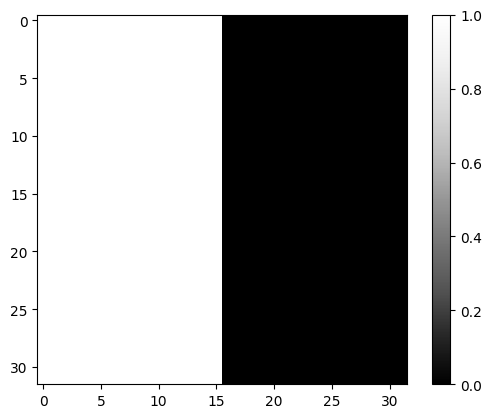

In [39]:
mask_left = torch.ones(1, 32, 16)
mask_right = torch.zeros(1, 32, 16)
mask = torch.cat((mask_left, mask_right), dim=2)

plt.imshow(mask.numpy().transpose(1, 2, 0), cmap="Greys_r")
plt.colorbar()
plt.show()

In [40]:
if False:
    a = optimization_inpaint(next(iter(test_dataloader))[0], mask, model, 10000, descale_data)

## Latent Space Exploration

We can also do latent space "walks" like for VAEs. The interesting thing with the multi-level Glow model is that the latent variables form a kind of hierarchy. So we can see what happens when we only change parts of the hierarchy, leaving the rest untouched.

This first part is pretty much copy-paste from the VAE notebook. We just have change the encoder/decoder calls to the forward/backward transforms.

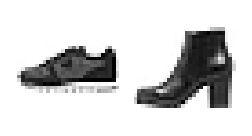

In [41]:
# pick two random images and plot
randind1 = np.random.randint(len(test_data))
randind2 = np.random.randint(len(test_data))

# annoying indexing since we only want 1 image but need a batch axis for model inputs.
# first get random index, then 0 to only get the image (not label), then add batch axis
image1 = test_data[randind1][0][torch.newaxis]
image2 = test_data[randind2][0][torch.newaxis]

# and here we remove the batch axis again :)
with torch.inference_mode():
    code1 = model(image1.to(device))[0][0]
    code2 = model(image2.to(device))[0][0]

# see the images we are dealing with here
concated = np.concatenate((descale_data(image1)[0], descale_data(image2)[0]), axis=2).transpose(1, 2, 0)
plt.figure(figsize=(3,3))
plt.imshow(concated, cmap="Greys", vmin=0, vmax=1)
plt.axis("off")
plt.show()

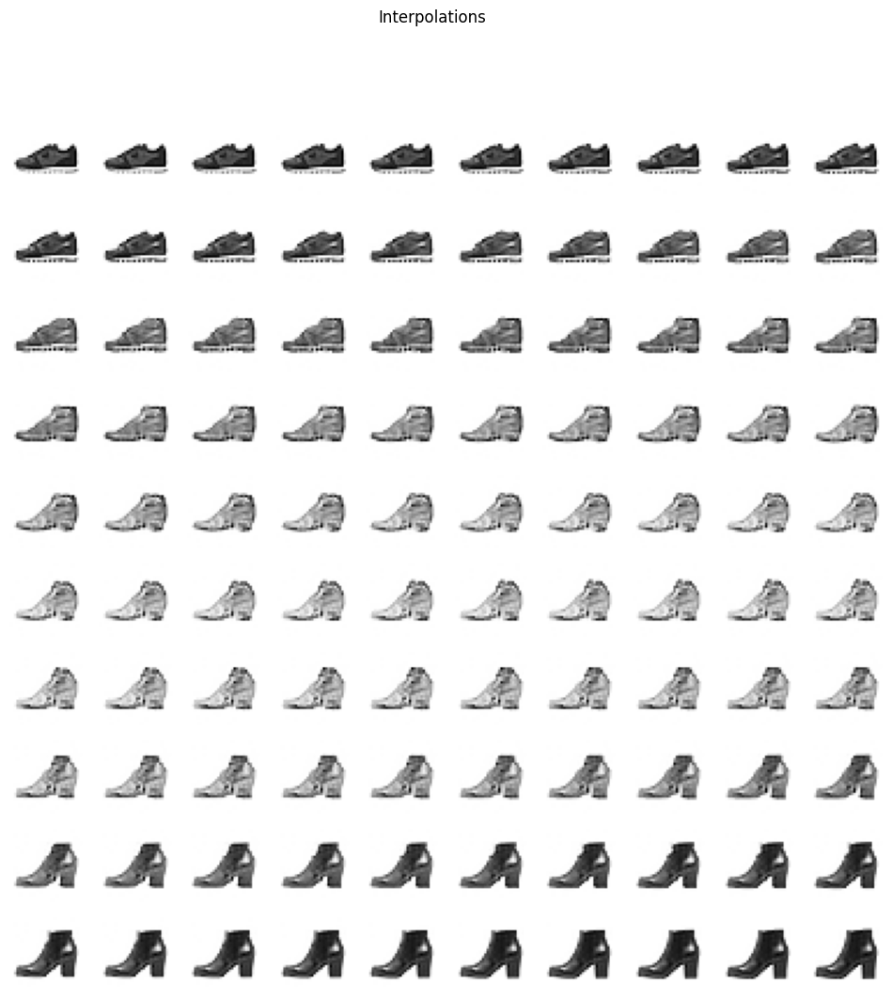

In [42]:
from lgm.common import interpolate


interpolated_codes = interpolate(code1, code2, n_interpolations=100)
# actually look at the interpolations
# NOTE that the 2D grid layout implies there's something 2D happening here.
# it's not. it's just saves space to display the images this way.
# it's a 1d interpolation from top left to bottom right.
# it would be clearer to plot it all in one row or column.
with torch.inference_mode():
    interpolated_images = torch.clamp(descale_data(model.transform_backward(interpolated_codes)), 0, 1)
plot_image_grid(interpolated_images, figure_size=(12, 12), title="Interpolations", n_rows=10)

Now we can try interpolating only specific levels.
The idea here is to only change the variables in the first $n$ levels, with the deeper ones remaining the same.
For example, with `interpolation_levels=1`, only the first-level latents (which is half of the total) will be changed from `code1` to `code2`. The rest will stay as in `code1`. You should see more of the input changing as you increase `interpolation_levels`, until when you reach the maximum (`n_level` defined for the model), you are just performing standard interpolation.

Note that this works better for more detailed images, e.g. higher-resolution face images.

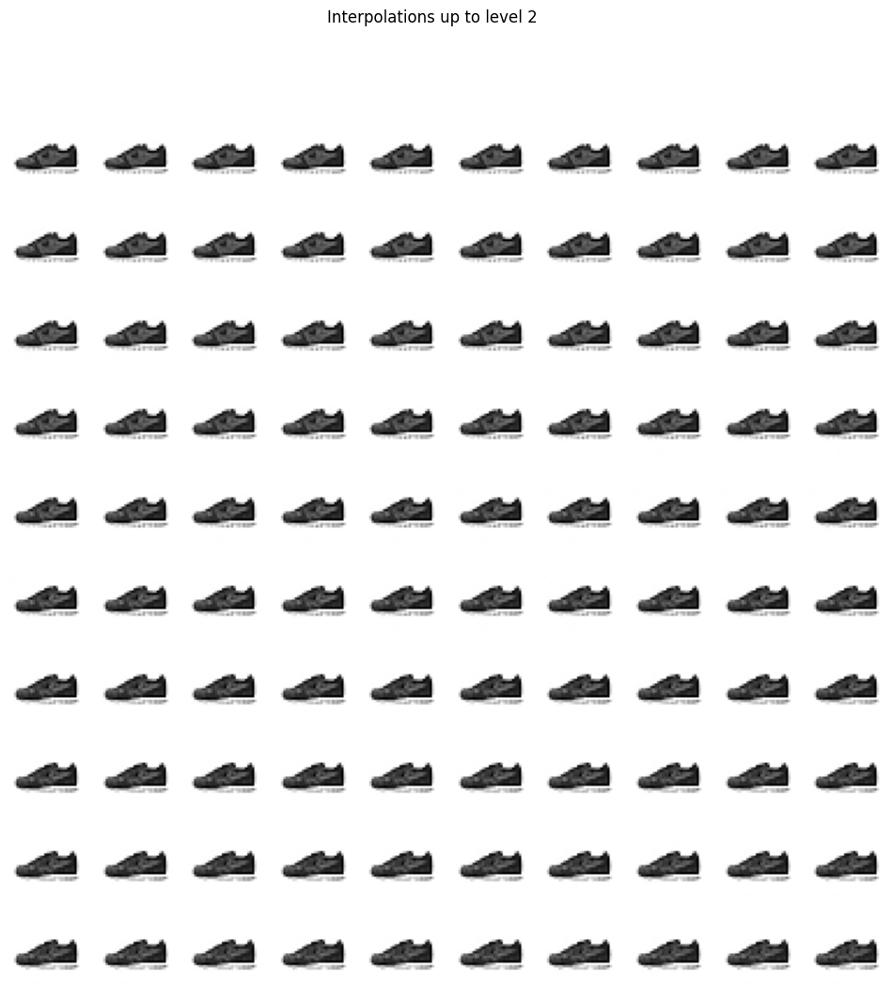

In [43]:
from lgm.flow import interpolate_partial


max_level = 2
level_interpolated_codes = interpolate_partial(code1, code2, max_level, n_levels, 100)
with torch.inference_mode():
    level_interpolated_images = torch.clamp(descale_data(model.transform_backward(level_interpolated_codes)), 0, 1)
plot_image_grid(level_interpolated_images, figure_size=(12, 12), title=f"Interpolations up to level {max_level}", n_rows=10)